# Dataset

In [1]:
# Import the pandas library and alias it as pd
import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv('/Users/akshaymohan/Desktop/Main_Project/Dataset/IMDB.csv')

# Remove '<br />' tags from the 'review' column
df['review'] = df['review'].str.replace('<br />', '')

# Display the DataFrame
df


,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. The filming tec...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive
...,...,...
49995,I thought this movie did a down right good job...,positive
49996,"Bad plot, bad dialogue, bad acting, idiotic di...",negative
49997,I am a Catholic taught in parochial elementary...,negative
49998,I'm going to have to disagree with the previou...,negative


In [2]:
# Import necessary libraries
from nltk.corpus import stopwords
import re

# Define the preprocess_text function
def preprocess_text(sen):
    # Convert the input sentence to lowercase
    sentence = sen.lower()

    # Remove punctuations and numbers using regular expressions
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Remove single characters (e.g., 'a', 'I') which may not carry significant meaning
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Remove multiple spaces by replacing them with a single space
    sentence = re.sub(r'\s+', ' ', sentence)

    # Remove stopwords from the sentence
    pattern = re.compile(r'\b(' + r'|'.join(stopwords.words('english')) + r')\b\s*')
    sentence = pattern.sub('', sentence)

    return sentence

# Apply the preprocess_text function to the 'review' column of the DataFrame
df['review'] = df['review'].apply(preprocess_text)

In [3]:
df

,review,sentiment
0,one reviewers mentioned watching oz episode ho...,positive
1,wonderful little production filming technique ...,positive
2,thought wonderful way spend time hot summer we...,positive
3,basically family little boy jake thinks zombie...,negative
4,petter mattei love time money visually stunnin...,positive
...,...,...
49995,thought movie right good job creative original...,positive
49996,bad plot bad dialogue bad acting idiotic direc...,negative
49997,catholic taught parochial elementary schools n...,negative
49998,going disagree previous comment side maltin on...,negative


### Applying Vader to compare the real sentiment

In [4]:
# Importing the Natural Language Toolkit (NLTK)
import nltk

# Import the SentimentIntensityAnalyzer from NLTK's VADER module
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Download the VADER lexicon (if not already downloaded)
nltk.download("vader_lexicon")


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/akshaymohan/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [5]:
# Import necessary libraries
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm import tqdm
import pandas as pd

# Create a SentimentIntensityAnalyzer object for sentiment analysis
sia = SentimentIntensityAnalyzer()

# Initialize lists to store sentiment scores

vader_compound = []

# Iterate through each review in the DataFrame using tqdm
for review_vader in tqdm(df['review'], total=len(df)):
    # Perform sentiment analysis using the SentimentIntensityAnalyzer
    scores = sia.polarity_scores(review_vader)
    
    # Extract and store the sentiment scores
    vader_compound.append(scores['compound'])  # Compound sentiment score (overall sentiment)

# Add sentiment scores to the DataFrame
df['Vader_Compound'] = vader_compound  # Compound sentiment score (overall sentiment)

# Display the updated DataFrame
df

100%|███████████████████████████████████| 50000/50000 [00:35<00:00, 1412.64it/s]


,review,sentiment,Vader_Compound
0,one reviewers mentioned watching oz episode ho...,positive,-0.9927
1,wonderful little production filming technique ...,positive,0.9582
2,thought wonderful way spend time hot summer we...,positive,0.9609
3,basically family little boy jake thinks zombie...,negative,-0.8858
4,petter mattei love time money visually stunnin...,positive,0.9887
...,...,...,...
49995,thought movie right good job creative original...,positive,0.9870
49996,bad plot bad dialogue bad acting idiotic direc...,negative,-0.9129
49997,catholic taught parochial elementary schools n...,negative,-0.8416
49998,going disagree previous comment side maltin on...,negative,-0.5267


In [6]:
# Extract the 'Vader_Compound' values from the DataFrame 'df'
score_vad = df['Vader_Compound'].values

# Initialize an empty list 'sentiment' to store sentiment labels
sentiment_vader = []

# Setting threshold values for the compound score and assigning sentiment labels
for i in score_vad:
    if i >= 0.1:
        sentiment_vader.append('positive')  # Positive sentiment
    elif i <= -0.1:
        sentiment_vader.append('negative')  # Negative sentiment
    else:
        sentiment_vader.append('neutral')  # Neutral sentiment

# Add the 'Sentiment' column to the DataFrame 'df'
df.loc[:, 'Vader_Sentiment'] = sentiment_vader  # Use .loc to assign values

# Create a new DataFrame 'new_df' containing 'review' and 'Sentiment' columns
new_df = df[['review', 'sentiment', 'Vader_Sentiment']]

# Display the 'new_df' DataFrame
new_df


,review,sentiment,Vader_Sentiment
0,one reviewers mentioned watching oz episode ho...,positive,negative
1,wonderful little production filming technique ...,positive,positive
2,thought wonderful way spend time hot summer we...,positive,positive
3,basically family little boy jake thinks zombie...,negative,negative
4,petter mattei love time money visually stunnin...,positive,positive
...,...,...,...
49995,thought movie right good job creative original...,positive,positive
49996,bad plot bad dialogue bad acting idiotic direc...,negative,negative
49997,catholic taught parochial elementary schools n...,negative,negative
49998,going disagree previous comment side maltin on...,negative,negative


In [7]:

# Filter and drop rows based on conditions
filtered_df = new_df[(new_df['Vader_Sentiment'] == 'neutral') | (new_df['Vader_Sentiment'] == new_df['sentiment'])]

# Display the filtered DataFrame
filtered_df.head(30)

,review,sentiment,Vader_Sentiment
1,wonderful little production filming technique ...,positive,positive
2,thought wonderful way spend time hot summer we...,positive,positive
3,basically family little boy jake thinks zombie...,negative,negative
4,petter mattei love time money visually stunnin...,positive,positive
5,probably time favorite movie story selflessnes...,positive,positive
6,sure would like see resurrection dated seahunt...,positive,positive
8,encouraged positive comments film looking forw...,negative,negative
9,like original gut wrenching laughter like movi...,positive,positive
14,fantastic movie three prisoners become famous ...,positive,positive
15,kind drawn erotic scenes realize one amateuris...,negative,neutral


In [8]:
# Print the number of values for each sentiment.
print(filtered_df['Vader_Sentiment'].value_counts())

positive    21540
negative    11637
neutral      1037
Name: Vader_Sentiment, dtype: int64


In [9]:
# Get the counts of 'positive' and 'negative' in the 'Vader_Sentiment' column
positive_count = (filtered_df['Vader_Sentiment'] == 'positive').sum()
negative_count = (filtered_df['Vader_Sentiment'] == 'negative').sum()

# Find the minimum count among 'positive' and 'negative'
min_count = min(positive_count, negative_count)

# Print the minimum count
print(min_count)

11637


In [10]:
# Number of rows to sample for each category
sample_size = min_count

# Create a DataFrame for each category
positive_df = filtered_df[filtered_df['Vader_Sentiment'] == 'positive']
negative_df = filtered_df[filtered_df['Vader_Sentiment'] == 'negative']
neutral_df = filtered_df[filtered_df['Vader_Sentiment'] == 'neutral']

# Randomly sample rows from each category
random_positive = positive_df.sample(n=sample_size, random_state=42)
random_negative = negative_df.sample(n=sample_size, random_state=42)
random_neutral = neutral_df

# Concatenate the sampled DataFrames
result_df = pd.concat([random_positive, random_negative, random_neutral])

# Shuffle the rows to randomize the order
result_df = result_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Display the resulting DataFrame
result_df

,review,sentiment,Vader_Sentiment
0,four lovely young nurses last year nursing sch...,positive,positive
1,tigerland one finest films seen opinion outdoe...,positive,positive
2,saw movie cover first thing thought made video...,negative,negative
3,found film dvd discount rack worth camera work...,negative,negative
4,caught movie glenwood cinemas weekend part kan...,positive,positive
...,...,...,...
24306,apparently viewer knows nothing history europe...,negative,negative
24307,thought children show good job especially enjo...,positive,positive
24308,clive barker hellraiser fame written produced ...,positive,positive
24309,quote oedpius rex tragedy film even made one w...,negative,negative


In [11]:
# Print the number of values for each sentiment.
print(result_df['Vader_Sentiment'].value_counts())

positive    11637
negative    11637
neutral      1037
Name: Vader_Sentiment, dtype: int64


### Splitting the reviews

In [12]:
# Import necessary libraries
import pandas as pd
import textwrap
from tqdm import tqdm  # Import tqdm for the progress bar

# Function to split text into cells with a maximum of 'max_words' words
def split_review(review, max_words):
    words = review.split()
    wrapped_text = textwrap.wrap(' '.join(words), width=max_words)
    return wrapped_text

# Define the maximum number of words per cell
max_words_per_cell = 40

# Create an empty dictionary to store the new data
new_data = {'review': []}

# Use tqdm to add a progress bar to the iteration for processing reviews
for review in tqdm(result_df['review'], desc="Processing reviews"):
    # Split the review into cells with a maximum of 'max_words_per_cell' words
    splitted_review = split_review(review, max_words_per_cell)
    
    # Extend the 'review' key in the 'new_data' dictionary with the splitted review
    new_data['review'].extend(splitted_review)

# Create a new DataFrame 'new_df' from the 'new_data' dictionary
splitted_df = pd.DataFrame(new_data)

# Print the resulting DataFrame
print(splitted_df)


Processing reviews: 100%|███████████████| 24311/24311 [00:02<00:00, 8414.52it/s]

                                         review
0            four lovely young nurses last year
1       nursing school experience kinds turmoil
2          excitement lives sweet susan winsome
3          brunette elaine giftos tries comfort
4             bitter terminally ill greg moving
...                                         ...
523906    film makes great impression hear well
523907  known phrase rob banks film still worth
523908         watching although could expected
523909     something bigger sam mendes american
523910                                   beauty

[523911 rows x 1 columns]


In [13]:
print(splitted_df.iloc[2])

review    excitement lives sweet susan winsome
Name: 2, dtype: object


## Vader

In [14]:
# Import necessary libraries
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm import tqdm
import pandas as pd

# Already downloaded the VADER lexicon
#nltk.download("vader_lexicon")

# Create a SentimentIntensityAnalyzer object for sentiment analysis
sia = SentimentIntensityAnalyzer()

# Initialize lists to store sentiment scores
vader_pos = []
vader_neg = []
vader_neu = []
vader_compound = []

# Iterate through each review in the DataFrame using tqdm
for review in tqdm(splitted_df['review'], total=len(splitted_df)):
    # Perform sentiment analysis using the SentimentIntensityAnalyzer
    scores = sia.polarity_scores(review)
    
    # Extract and store the sentiment scores
    vader_pos.append(scores['pos'])         # Positive sentiment score
    vader_neg.append(scores['neg'])         # Negative sentiment score
    vader_neu.append(scores['neu'])         # Neutral sentiment score
    vader_compound.append(scores['compound'])  # Compound sentiment score (overall sentiment)

# Add sentiment scores to the DataFrame
splitted_df['Vader_Pos'] = vader_pos         # Positive sentiment score
splitted_df['Vader_Neg'] = vader_neg         # Negative sentiment score
splitted_df['Vader_Neu'] = vader_neu         # Neutral sentiment score
splitted_df['Vader_Compound'] = vader_compound  # Compound sentiment score (overall sentiment)

# Display the updated DataFrame
splitted_df


100%|████████████████████████████████| 523911/523911 [00:18<00:00, 27721.60it/s]


,review,Vader_Pos,Vader_Neg,Vader_Neu,Vader_Compound
0,four lovely young nurses last year,0.432,0.000,0.568,0.5859
1,nursing school experience kinds turmoil,0.000,0.385,0.615,-0.3612
2,excitement lives sweet susan winsome,0.674,0.000,0.326,0.7351
3,brunette elaine giftos tries comfort,0.385,0.000,0.615,0.3612
4,bitter terminally ill greg moving,0.000,0.651,0.349,-0.6808
...,...,...,...,...,...
523906,film makes great impression hear well,0.730,0.000,0.270,0.7964
523907,known phrase rob banks film still worth,0.181,0.343,0.476,-0.4019
523908,watching although could expected,0.000,0.000,1.000,0.0000
523909,something bigger sam mendes american,0.000,0.000,1.000,0.0000


In [16]:
# Extract the 'Vader_Compound' values from the DataFrame 'splitted_df'
score_v = splitted_df['Vader_Compound'].values

# Initialize an empty list 'sentiment' to store sentiment labels
sentiment = []

# Setting threshold values for the compound score and assigning sentiment labels
for i in score_v:
    if i >= 0.1:
        sentiment.append(1)  # Positive sentiment
    elif i <= -0.1:
        sentiment.append(2)  # Negative sentiment
    else:
        sentiment.append(0)  # Neutral sentiment

# Add the 'Sentiment' column to the DataFrame 'splitted_df'
splitted_df.loc[:, 'Sentiment'] = sentiment  # Use .loc to assign values

# Create a new DataFrame 'set_df' containing 'review' and 'Sentiment' columns
set_df = splitted_df[['review', 'Sentiment']]

# Display the first few rows of the 'set_df' DataFrame
set_df.head()


,review,Sentiment
0,four lovely young nurses last year,1
1,nursing school experience kinds turmoil,2
2,excitement lives sweet susan winsome,1
3,brunette elaine giftos tries comfort,1
4,bitter terminally ill greg moving,2


In [17]:
set_df.shape

(523911, 2)

In [18]:
# Print the number of values for each sentiment.
print(set_df['Sentiment'].value_counts())

0    205310
1    178862
2    139739
Name: Sentiment, dtype: int64


## Visualisation of the IMDB dataset

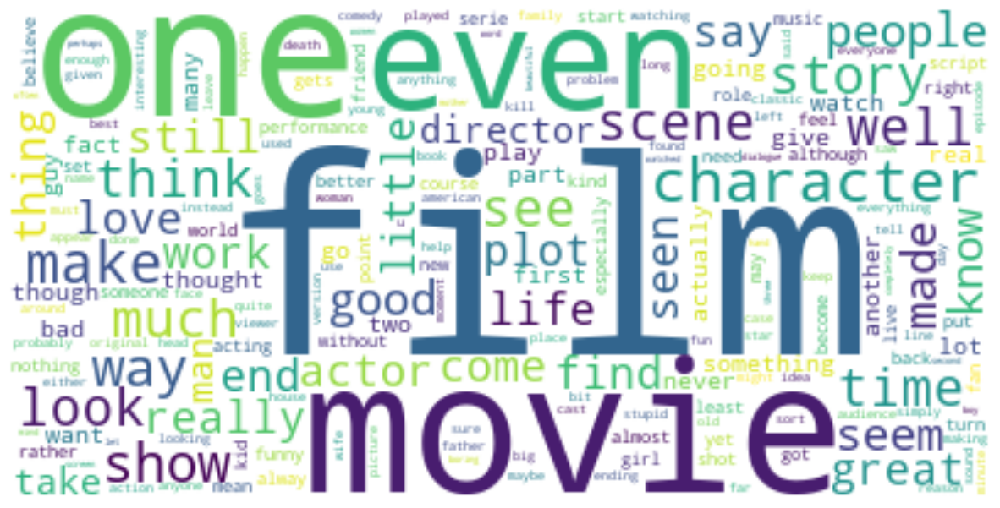

In [19]:
# Import required libraries for creating a word cloud
import matplotlib.pyplot as plt

# Check if the 'wordcloud' library is available; if not, install it
try:
    from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
except:
    !pip install wordcloud  # Install 'wordcloud' library
    from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Combine all reviews into a single text
text = " ".join(i for i in set_df.review)

# Create a set of stopwords
stopwords = set(STOPWORDS)

# Create a WordCloud object with specified settings
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the WordCloud visualization
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


# Training

# SNN

In [20]:
# Import the Tokenizer class from Keras for text tokenization
try:
    from keras.preprocessing.text import Tokenizer
except:
    !pip install tensorflow
    from keras.preprocessing.text import Tokenizer


In [21]:
# Extract the 'Review' column as input features (X) and the 'Sentiment' column as target labels (y)
x = set_df['review']
y = set_df['Sentiment']

# Importing necessary libraries to split the dataset into testing and training sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test =train_test_split(x,y,test_size=0.20)

In [22]:

# Create a Tokenizer instance
# num_words: Maximum number of words to keep based on word frequency (only the most common num_words words will be kept)
# lower: Convert text to lowercase
tokenizer = Tokenizer(num_words=1000,lower=True)

# Fit the tokenizer on the training data
tokenizer.fit_on_texts(X_train)

# Convert the text data to sequences using the fitted tokenizer
X_train = tokenizer.texts_to_sequences(X_train)
X_test = tokenizer.texts_to_sequences(X_test)

# Calculate the vocabulary size for the tokenizer
vocab_size = len(tokenizer.word_index) + 1

# Display the vocabulary size
vocab_size

67543

In [23]:
# Import the required function for padding sequences
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Define the maximum length for sequences (sentences)
maxlen = 100

# Pad the training sequences to ensure uniform length
X_train = pad_sequences(X_train, padding='post', maxlen=maxlen)

# Pad the testing sequences similarly
X_test = pad_sequences(X_test, padding='post', maxlen=maxlen)

# Display the padded sequence of the third training example
print(X_train[2, :])


[975 112 834 129   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]


In [24]:
# Import required functions from numpy library
from numpy import asarray
from numpy import zeros

# Create an empty dictionary to store word embeddings
embeddings_dictionary = dict()

# Open the GloVe file for reading
glove_file = open('/Users/akshaymohan/Downloads/a2_glove.6B.100d.txt', encoding='utf8')

# Loop through each line in the GloVe file
for line in glove_file:
    # Split the line into individual records (words and vector components)
    records = line.split()

    # Extract the word from the first record
    word = records[0]

    # Convert the remaining vector components into a NumPy array of float32
    vector_dimensions = asarray(records[1:], dtype='float32')

    # Store the word and its associated vector in the embeddings dictionary
    embeddings_dictionary[word] = vector_dimensions

# Close the GloVe file
glove_file.close()


In [25]:
# Each row corresponds to a word index, and each column represents a dimension of the embedding
embedding_matrix = zeros((vocab_size, 100))

# Loop through each word and its corresponding index in the tokenizer's word index
for word, index in tokenizer.word_index.items():
    # Get the pre-trained GloVe embedding vector for the current word
    embedding_vector = embeddings_dictionary.get(word)

    # Check if the word has an associated embedding vector
    if embedding_vector is not None:
        # If an embedding vector exists, set the corresponding row in the embedding matrix to the vector
        embedding_matrix[index] = embedding_vector


In [26]:
# Get the shape of the embedding matrix
embedding_matrix.shape


(67543, 100)

In [27]:
# Import the required modules and classes from Keras
try:
    from keras.models import Sequential
    from keras.layers.core import Activation, Dropout, Dense
    from keras.layers import Flatten, GlobalMaxPooling1D, Embedding, Conv1D, LSTM
except:
    !pip install tensorflow
    from tensorflow import keras
    from tensorflow.keras.layers import Activation, Dropout, Dense
    from keras.layers import Flatten, GlobalMaxPooling1D, Embedding, Conv1D, LSTM
    from keras.models import Sequential

In [29]:
from sklearn.utils.class_weight import compute_class_weight
from keras.models import Sequential
from keras.layers import Embedding, Flatten, Dense
from keras.optimizers import Adam
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
import numpy as np

# Encode class labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_train_encoded = to_categorical(y_train_encoded)

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))



In [30]:
# Create a Sequential model
snn_model = Sequential()

# Create an Embedding layer with pre-trained embeddings
embedding_layer = Embedding(vocab_size, 100, weights=[embedding_matrix], input_length=maxlen, trainable=False)

# Add the Embedding layer to the model
snn_model.add(embedding_layer)

# Add a Flatten layer to reshape the data
snn_model.add(Flatten())

# Add a Dense layer for multi-class classification with softmax activation
snn_model.add(Dense(len(np.unique(y_train)), activation='softmax'))  # Number of classes is determined dynamically

# Compile the model with specified optimizer, loss, and metrics
snn_model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print a summary of the model's architecture
print(snn_model.summary())


# Train the model using the training data
snn_model_history = snn_model.fit(X_train, y_train_encoded, batch_size=128, epochs=100, verbose=1, validation_split=0.2, class_weight=class_weight_dict)



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 100, 100)          6754300   
                                                                 
 flatten_1 (Flatten)         (None, 10000)             0         
                                                                 
 dense_1 (Dense)             (None, 3)                 30003     
                                                                 
Total params: 6784303 (25.88 MB)
Trainable params: 30003 (117.20 KB)
Non-trainable params: 6754300 (25.77 MB)
_________________________________________________________________
None
Epoch 1/100
2620/2620 [==============================] - 5s 2ms/step - loss: 0.8742 - accuracy: 0.6097 - val_loss: 0.8581 - val_accuracy: 0.6184
Epoch 2/100
2620/2620 [==============================] - 4s 2ms/step - loss: 0.8527 - accuracy: 0.6216 - val_loss: 0.8501 - 

2620/2620 [==============================] - 5s 2ms/step - loss: 0.8504 - accuracy: 0.6236 - val_loss: 0.8553 - val_accuracy: 0.6210
Epoch 52/100
2620/2620 [==============================] - 4s 2ms/step - loss: 0.8502 - accuracy: 0.6233 - val_loss: 0.8526 - val_accuracy: 0.6241
Epoch 53/100
2620/2620 [==============================] - 5s 2ms/step - loss: 0.8505 - accuracy: 0.6237 - val_loss: 0.8498 - val_accuracy: 0.6287
Epoch 54/100
2620/2620 [==============================] - 5s 2ms/step - loss: 0.8505 - accuracy: 0.6236 - val_loss: 0.8495 - val_accuracy: 0.6304
Epoch 55/100
2620/2620 [==============================] - 5s 2ms/step - loss: 0.8505 - accuracy: 0.6231 - val_loss: 0.8551 - val_accuracy: 0.6233
Epoch 56/100
2620/2620 [==============================] - 5s 2ms/step - loss: 0.8503 - accuracy: 0.6233 - val_loss: 0.8494 - val_accuracy: 0.6280
Epoch 57/100
2620/2620 [==============================] - 4s 2ms/step - loss: 0.8504 - accuracy: 0.6231 - val_loss: 0.8488 - val_accuracy

In [31]:
print(np.unique(y_train))

[0 1 2]


In [32]:
# Predictions on the Test Set
y_pred = snn_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert one-hot encoded predictions to class labels


3275/3275 [==============================] - 1s 380us/step


In [33]:
# Print classification report (precision, recall, F1-score)
print(classification_report(y_test, y_pred_classes))

              precision    recall  f1-score   support

           0       0.61      0.59      0.60     41031
           1       0.66      0.65      0.65     35876
           2       0.56      0.59      0.57     27876

    accuracy                           0.61    104783
   macro avg       0.61      0.61      0.61    104783
weighted avg       0.61      0.61      0.61    104783



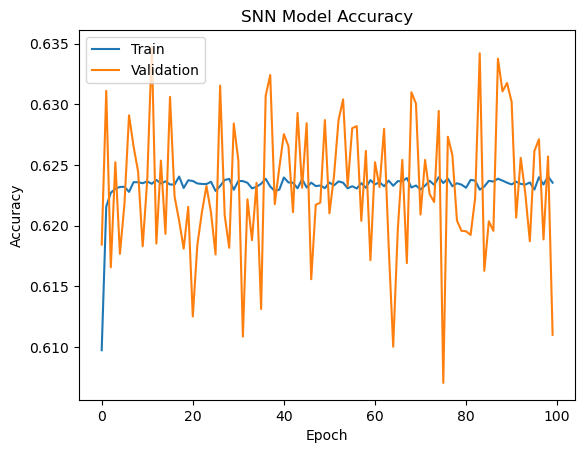

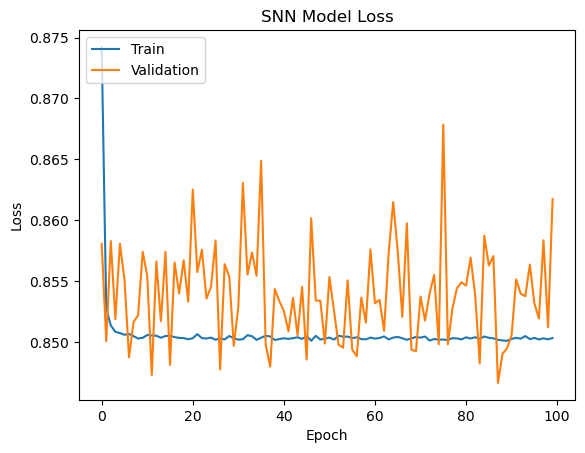

In [53]:
import matplotlib.pyplot as plt

# Plotting model accuracy during training
plt.plot(snn_model_history.history['accuracy'])  # Training accuracy values per epoch
plt.plot(snn_model_history.history['val_accuracy'])  # Validation accuracy values per epoch

plt.title('SNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')  # Legend labels for the plot
plt.show()  # Display the plot

# Plotting model loss during training
plt.plot(snn_model_history.history['loss'])  # Training loss values per epoch
plt.plot(snn_model_history.history['val_loss'])  # Validation loss values per epoch

plt.title('SNN Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')  # Legend labels for the plot
plt.show()  # Display the plot


In [37]:
# Save the model
snn_model.save("/Users/akshaymohan/Desktop/Main_Project/saved_model/SNN_model.h5", save_format='h5')


/opt/anaconda3/lib/python3.9/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# CNN

In [56]:
from sklearn.utils.class_weight import compute_class_weight
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, GlobalMaxPooling1D, Dense
from keras.optimizers import Adam
from keras.metrics import Precision, Recall, AUC
from keras.utils import to_categorical
import numpy as np

# Encode class labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_train_encoded = to_categorical(y_train_encoded)  # One-hot encode the labels

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))


In [57]:
# Create a Sequential model
cnn_model = Sequential()

# Create an Embedding layer with pre-trained embeddings
embedding_layer = Embedding(vocab_size, 100, weights=[embedding_matrix], input_length=maxlen, trainable=False)
cnn_model.add(embedding_layer)

# Add a 1D Convolutional layer with 128 filters and a ReLU activation
cnn_model.add(Conv1D(128, 5, activation='relu'))

# Add a Global Max Pooling layer
cnn_model.add(GlobalMaxPooling1D())

# Add a Dense layer for multi-class classification with softmax activation
cnn_model.add(Dense(len(np.unique(y_train)), activation='softmax'))  # Number of classes is determined dynamically

# Compile the CNN model with the legacy optimizer
cnn_model.compile(optimizer='adam',  # Use legacy optimizer
                  loss='categorical_crossentropy',
                  metrics=['accuracy', Precision(), Recall(), AUC()])

# Print a summary of the CNN model's architecture
print(cnn_model.summary())

# Train the CNN model using the training data
cnn_model_history = cnn_model.fit(X_train, y_train_encoded,
                                  batch_size=64,
                                  epochs=50,
                                  verbose=1,
                                  validation_split=0.2,
                                  class_weight=class_weight_dict)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, 100, 100)          6754300   
                                                                 
 conv1d_1 (Conv1D)           (None, 96, 128)           64128     
                                                                 
 global_max_pooling1d_2 (Gl  (None, 128)               0         
 obalMaxPooling1D)                                               
                                                                 
 dense_5 (Dense)             (None, 3)                 387       
                                                                 
Total params: 6818815 (26.01 MB)
Trainable params: 64515 (252.01 KB)
Non-trainable params: 6754300 (25.77 MB)
_________________________________________________________________
None
Epoch 1/50
5240/5240 [==============================] - 56s 11ms/step -

5240/5240 [==============================] - 60s 11ms/step - loss: 0.5584 - accuracy: 0.7792 - precision_2: 0.8224 - recall_2: 0.7035 - auc_2: 0.9175 - val_loss: 0.7692 - val_accuracy: 0.7220 - val_precision_2: 0.7410 - val_recall_2: 0.6823 - val_auc_2: 0.8627
Epoch 28/50
5240/5240 [==============================] - 61s 12ms/step - loss: 0.5564 - accuracy: 0.7795 - precision_2: 0.8219 - recall_2: 0.7076 - auc_2: 0.9181 - val_loss: 0.7746 - val_accuracy: 0.7227 - val_precision_2: 0.7414 - val_recall_2: 0.6820 - val_auc_2: 0.8617
Epoch 29/50
5240/5240 [==============================] - 61s 12ms/step - loss: 0.5545 - accuracy: 0.7807 - precision_2: 0.8213 - recall_2: 0.7102 - auc_2: 0.9186 - val_loss: 0.7827 - val_accuracy: 0.7217 - val_precision_2: 0.7638 - val_recall_2: 0.6207 - val_auc_2: 0.8627
Epoch 30/50
5240/5240 [==============================] - 62s 12ms/step - loss: 0.5529 - accuracy: 0.7810 - precision_2: 0.8248 - recall_2: 0.7059 - auc_2: 0.9190 - val_loss: 0.7878 - val_accura

In [58]:
# Predictions on the Test Set
y_pred_cnn = cnn_model.predict(X_test)
y_pred_classes_cnn = np.argmax(y_pred_cnn, axis=1)  # Convert one-hot encoded predictions to class labels


3275/3275 [==============================] - 7s 2ms/step


In [59]:
# Print classification report (precision, recall, F1-score)
print(classification_report(y_test, y_pred_classes_cnn))

              precision    recall  f1-score   support

           0       0.64      0.82      0.72     41031
           1       0.83      0.69      0.75     35876
           2       0.70      0.56      0.62     27876

    accuracy                           0.71    104783
   macro avg       0.72      0.69      0.70    104783
weighted avg       0.72      0.71      0.71    104783



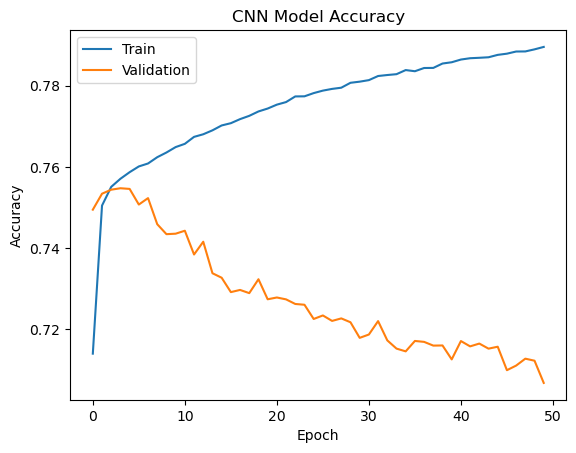

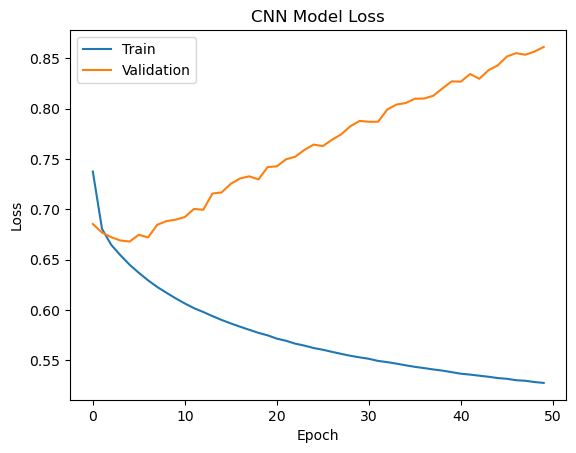

In [60]:
# Import the required library
import matplotlib.pyplot as plt

# Plotting model accuracy during training
plt.plot(cnn_model_history.history['accuracy'])  # Training accuracy values per epoch
plt.plot(cnn_model_history.history['val_accuracy'])  # Validation accuracy values per epoch

plt.title('CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')  # Legend labels for the plot
plt.show()  # Display the plot

# Plotting model loss during training
plt.plot(cnn_model_history.history['loss'])  # Training loss values per epoch
plt.plot(cnn_model_history.history['val_loss'])  # Validation loss values per epoch

plt.title('CNN Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')  # Legend labels for the plot
plt.show()  # Display the plot


In [61]:
cnn_model.save("/Users/akshaymohan/Desktop/Main_Project/saved_model/CNN_model.h5", save_format='h5')


/opt/anaconda3/lib/python3.9/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# LSTM

In [47]:
from sklearn.utils.class_weight import compute_class_weight
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense, Dropout
from keras.optimizers import Adam
from keras.metrics import Precision, Recall, AUC
from keras.utils import to_categorical
import numpy as np

# Encode class labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_train_encoded = to_categorical(y_train_encoded)  # One-hot encode the labels

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))

# Create a Sequential model
lstm_model = Sequential()

# Create an Embedding layer with pre-trained embeddings
embedding_layer = Embedding(vocab_size, 100, weights=[embedding_matrix], input_length=maxlen, trainable=False)
lstm_model.add(embedding_layer)

# Add an LSTM layer with 128 units and return sequences
lstm_model.add(LSTM(128, return_sequences=True, dropout=0.2, recurrent_dropout=0.2))

# Add another LSTM layer with 64 units and return sequences
lstm_model.add(LSTM(64, return_sequences=True, dropout=0.2, recurrent_dropout=0.2))

# Add a Global Max Pooling layer
lstm_model.add(GlobalMaxPooling1D())

# Add a Dropout layer to reduce overfitting
lstm_model.add(Dropout(0.5))

# Add a Dense layer with 128 units and ReLU activation
lstm_model.add(Dense(128, activation='relu'))

# Add another Dropout layer
lstm_model.add(Dropout(0.5))

# Add a Dense layer for multi-class classification with softmax activation
lstm_model.add(Dense(len(np.unique(y_train)), activation='softmax'))  # Number of classes is determined dynamically

# Compile the LSTM model
lstm_model.compile(optimizer='adam',
                   loss='categorical_crossentropy',
                   metrics=['accuracy', Precision(), Recall(), AUC()])

# Print a summary of the LSTM model's architecture
print(lstm_model.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 100, 100)          6754300   
                                                                 
 lstm (LSTM)                 (None, 100, 128)          117248    
                                                                 
 lstm_1 (LSTM)               (None, 100, 64)           49408     
                                                                 
 global_max_pooling1d_1 (Gl  (None, 64)                0         
 obalMaxPooling1D)                                               
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 128)               8320      
                                                      

In [48]:
# Train the LSTM model using the training data
lstm_model_history = lstm_model.fit(X_train, y_train_encoded,
                                    batch_size=64,
                                    epochs=10,
                                    verbose=1,
                                    validation_split=0.2,
                                    class_weight=class_weight_dict)

Epoch 1/10
5240/5240 [==============================] - 1455s 277ms/step - loss: 0.7482 - accuracy: 0.7068 - precision_1: 0.7597 - recall_1: 0.5916 - auc_1: 0.8503 - val_loss: 0.6518 - val_accuracy: 0.7589 - val_precision_1: 0.7686 - val_recall_1: 0.7380 - val_auc_1: 0.8862
Epoch 2/10
5240/5240 [==============================] - 1444s 276ms/step - loss: 0.6717 - accuracy: 0.7549 - precision_1: 0.7838 - recall_1: 0.6859 - auc_1: 0.8818 - val_loss: 0.6382 - val_accuracy: 0.7607 - val_precision_1: 0.7914 - val_recall_1: 0.6952 - val_auc_1: 0.8908
Epoch 3/10
5240/5240 [==============================] - 1450s 277ms/step - loss: 0.6578 - accuracy: 0.7596 - precision_1: 0.7889 - recall_1: 0.6918 - auc_1: 0.8867 - val_loss: 0.6332 - val_accuracy: 0.7667 - val_precision_1: 0.7948 - val_recall_1: 0.7048 - val_auc_1: 0.8938
Epoch 4/10
5240/5240 [==============================] - 1442s 275ms/step - loss: 0.6508 - accuracy: 0.7623 - precision_1: 0.7896 - recall_1: 0.6991 - auc_1: 0.8892 - val_loss:

In [49]:
# Predictions on the Test Set
y_pred_rnn = lstm_model.predict(X_test)
y_pred_classes_rnn = np.argmax(y_pred_rnn, axis=1)  # Convert one-hot encoded predictions to class labels


3275/3275 [==============================] - 87s 26ms/step


In [50]:
# Print classification report (precision, recall, F1-score)
print(classification_report(y_test, y_pred_classes_rnn))

              precision    recall  f1-score   support

           0       0.66      0.96      0.78     41031
           1       0.92      0.72      0.81     35876
           2       0.92      0.56      0.69     27876

    accuracy                           0.77    104783
   macro avg       0.83      0.74      0.76    104783
weighted avg       0.82      0.77      0.77    104783



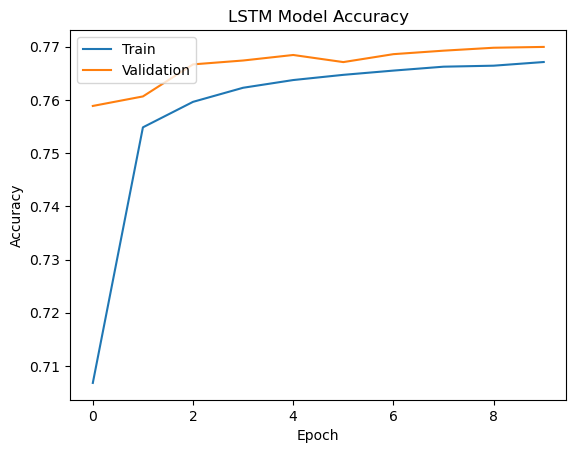

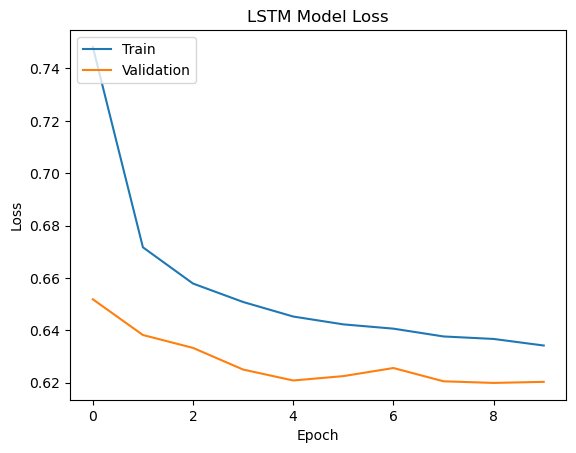

In [55]:
# Import the required library
import matplotlib.pyplot as plt

# Plotting model accuracy during training
plt.plot(lstm_model_history.history['accuracy'])  # Training accuracy values per epoch
plt.plot(lstm_model_history.history['val_accuracy'])  # Validation accuracy values per epoch

plt.title('LSTM Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')  # Legend labels for the plot
plt.show()  # Display the plot

# Plotting model loss during training
plt.plot(lstm_model_history.history['loss'])  # Training loss values per epoch
plt.plot(lstm_model_history.history['val_loss'])  # Validation loss values per epoch

plt.title('LSTM Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')  # Legend labels for the plot
plt.show()  # Display the plot


In [52]:
lstm_model.save("/Users/akshaymohan/Desktop/Main_Project/saved_model/LSTM_model.h5", save_format='h5')


/opt/anaconda3/lib/python3.9/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# Testing

# YT dataset

In [62]:
# Getting the youtube video URL.


#url = input("URL: ")
url = 'https://www.youtube.com/watch?v=2SjzqYLb-vk&ab_channel=TechSpurt'

# Remove the prefix from the URL.
#prefix = 'https://www.youtube.com/watch?v='

if url.startswith('https://www.youtube.com/watch?v='):
    prefix = 'https://www.youtube.com/watch?v='
elif url.startswith('https://www.youtube.com/shorts/'):
    prefix = 'https://www.youtube.com/shorts/'
else:
    prefix = None  # Default value if URL doesn't match any of the patterns


# Creating a variable video_id without the youtube url prefix.
video_id = url.replace(prefix, '')
print(video_id)


2SjzqYLb-vk&ab_channel=TechSpurt


In [63]:
# Importing the youtube transcript api for extracting the transcript and time from the video.

try:
  from youtube_transcript_api import YouTubeTranscriptApi
except:
  %pip install youtube_transcript_api
  from youtube_transcript_api import YouTubeTranscriptApi

import pandas as pd

# Get the transcript for the YouTube video
transcript = YouTubeTranscriptApi.get_transcript(video_id)

# Remove the word '[Music]' from the 'text' values
transcript_cleaned = [{'start': t['start'], 'Speech': t['text'].replace('[Music]', '')} for t in transcript]

# Extract the 'text' and 'start' values from the cleaned transcript
extracted_data = [{'start': t['start'], 'Speech': t['Speech']} for t in transcript_cleaned]

# Create a pandas DataFrame from the extracted data
yt_df = pd.DataFrame(extracted_data)

# Remove rows where 'Speech' is empty
yt_df = yt_df[yt_df['Speech'] != '']

In [64]:
ytt_df = yt_df
yt_df

,start,Speech
0,0.060,so you could blow a grand or even more
1,2.820,on a shiny new iPhone or some other
2,4.920,expensive Flagship blower or you can
3,7.500,save yourself a packet and stuff for one
4,9.300,of the best mid-range mobiles instead
...,...,...
582,1254.299,that notifications Bell have yourselves
583,1255.740,already wonderful rest of the week and
584,1257.480,I'll see you on the flip side cheers
585,1258.740,love you


In [65]:
# Calculations for combining the texts from every 3 seconds of the video.
time_s = ytt_df['start']

Time=[]
for i in time_s:
    calcu = i - (i%3)

    # Writing the calculations into the dataset.

    if (calcu % 3) == 0 :
        Time.append(calcu)
    else:
        Time.append(0)

ytt_df['Time'] = Time
# Displays the dataset
ytt_df.head()

,start,Speech,Time
0,0.06,so you could blow a grand or even more,0.0
1,2.82,on a shiny new iPhone or some other,0.0
2,4.92,expensive Flagship blower or you can,3.0
3,7.50,save yourself a packet and stuff for one,6.0
4,9.30,of the best mid-range mobiles instead,9.0


In [66]:
# Group the DataFrame by 'Time' column and combine the 'Text' values
ytt_df = ytt_df.groupby('Time')['Speech'].apply(lambda x: ' '.join(x)).reset_index()

ytt_df.head()

,Time,Speech
0,0.0,so you could blow a grand or even more on a sh...
1,3.0,expensive Flagship blower or you can
2,6.0,save yourself a packet and stuff for one
3,9.0,of the best mid-range mobiles instead because ...
4,12.0,Google nothing and OnePlus offer phones


In [67]:
#0 = neutral
#1 = positive
#2 = negative

# Applying VADER on the YouTube transcription data

In [68]:
# Create a SentimentIntensityAnalyzer object for sentiment analysis
sia = SentimentIntensityAnalyzer()

# Initialize lists to store sentiment scores
vader_pos = []
vader_neg = []
vader_neu = []
vader_compound = []

# Iterate through each review in the DataFrame using tqdm
for revie in tqdm(ytt_df['Speech'], total=len(ytt_df)):
    scores = sia.polarity_scores(revie)
    vader_pos.append(scores['pos'])
    vader_neg.append(scores['neg'])
    vader_neu.append(scores['neu'])
    vader_compound.append(scores['compound'])

# Add sentiment scores to the DataFrame
ytt_df['Vader_Pos'] = vader_pos
ytt_df['Vader_Neg'] = vader_neg
ytt_df['Vader_Neu'] = vader_neu
ytt_df['Vader_Compound'] = vader_compound

# Display the updated DataFrame
ytt_df

100%|██████████████████████████████████████| 420/420 [00:00<00:00, 14120.54it/s]


,Time,Speech,Vader_Pos,Vader_Neg,Vader_Neu,Vader_Compound
0,0.0,so you could blow a grand or even more on a sh...,0.176,0.0,0.824,0.4588
1,3.0,expensive Flagship blower or you can,0.219,0.0,0.781,0.1027
2,6.0,save yourself a packet and stuff for one,0.348,0.0,0.652,0.4939
3,9.0,of the best mid-range mobiles instead because ...,0.389,0.0,0.611,0.7906
4,12.0,Google nothing and OnePlus offer phones,0.000,0.0,1.000,0.0000
...,...,...,...,...,...,...
415,1248.0,unless it's the iPhone SE because that is fran...,0.000,0.0,1.000,0.0000
416,1251.0,the meantime please do POG subscribe to,0.277,0.0,0.723,0.3182
417,1254.0,that notifications Bell have yourselves alread...,0.252,0.0,0.748,0.5719
418,1257.0,I'll see you on the flip side cheers love you,0.477,0.0,0.523,0.8074


In [69]:
score_yt = ytt_df['Vader_Compound'].values

# Setting threshold values for the compound score.
sentiment_yt=[]
for i in score_yt:
    if i >= 0.1:
        sentiment_yt.append(1) #positive
    elif i <= -0.1:
        sentiment_yt.append(2) #negative
    else:
        sentiment_yt.append(0) #neutral

ytt_df.loc[:, 'Vader_Sentiment'] = sentiment_yt  # Use .loc to assign values
y_df = ytt_df[['Time','Speech','Vader_Sentiment']]
y_df.head()

,Time,Speech,Vader_Sentiment
0,0.0,so you could blow a grand or even more on a sh...,1
1,3.0,expensive Flagship blower or you can,1
2,6.0,save yourself a packet and stuff for one,1
3,9.0,of the best mid-range mobiles instead because ...,1
4,12.0,Google nothing and OnePlus offer phones,0


In [70]:
# Create a list to store serial numbers
slno = []

# Generate serial numbers
for num in range(1, len(y_df) + 1):
    slno.append(num)

# Add the serial numbers to the DataFrame
y_df['Sl.No.'] = slno
# Reorder the columns
youtube_df = y_df[['Sl.No.', 'Time', 'Speech', 'Vader_Sentiment']]
youtube_df

/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/4122945685.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_df['Sl.No.'] = slno


,Sl.No.,Time,Speech,Vader_Sentiment
0,1,0.0,so you could blow a grand or even more on a sh...,1
1,2,3.0,expensive Flagship blower or you can,1
2,3,6.0,save yourself a packet and stuff for one,1
3,4,9.0,of the best mid-range mobiles instead because ...,1
4,5,12.0,Google nothing and OnePlus offer phones,0
...,...,...,...,...
415,416,1248.0,unless it's the iPhone SE because that is fran...,0
416,417,1251.0,the meantime please do POG subscribe to,1
417,418,1254.0,that notifications Bell have yourselves alread...,1
418,419,1257.0,I'll see you on the flip side cheers love you,1


In [71]:
youtube_df.head(15)

,Sl.No.,Time,Speech,Vader_Sentiment
0,1,0.0,so you could blow a grand or even more on a sh...,1
1,2,3.0,expensive Flagship blower or you can,1
2,3,6.0,save yourself a packet and stuff for one,1
3,4,9.0,of the best mid-range mobiles instead because ...,1
4,5,12.0,Google nothing and OnePlus offer phones,0
5,6,15.0,that cost half as much as an iPhone 14,0
6,7,18.0,but they still bore serious game and,2
7,8,21.0,performance you've got gorgeous screens premiu...,1
8,9,24.0,brilliant features than you can waft,1
9,10,27.0,even a generously sized stick at if,1


## Roberta

In [72]:
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax

In [73]:

import transformers

MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
roberta_tokenizer = transformers.AutoTokenizer.from_pretrained(MODEL)
model = transformers.AutoModelForSequenceClassification.from_pretrained(MODEL)


In [74]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

In [75]:
# For testing
example = "I am so cool man"#df.iloc[2,1]
print(example)

I am so cool man


In [76]:
# Testing the example using roberta model
encoded_text = roberta_tokenizer(example, return_tensors='pt')
output = model(**encoded_text)
scores = output[0][0].detach().numpy()
scores = softmax(scores)
scores_dict = {
    'roberta_negative' : scores[0],
    'roberta_neutral' : scores[1],
    'roberta_positive' : scores[2]
}
print(scores_dict)

{'roberta_negative': 0.0016562209, 'roberta_neutral': 0.012983702, 'roberta_positive': 0.9853601}


In [78]:
def polarity_scores_roberta(example):
    encoded_text = roberta_tokenizer(example, return_tensors='pt')
    output = model(**encoded_text)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    scores_dict = {
    'roberta_neg': f"{scores[0]:.3f}",
    'roberta_neu': f"{scores[1]:.3f}",
    'roberta_pos': f"{scores[2]:.3f}"
}
    return scores_dict
!export TOKENIZERS_PARALLELISM=false


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [79]:
# Run the polarity score on the entire dataset
res = {}
for i, row in tqdm(youtube_df.iterrows(), total=len(youtube_df)):
    one = row['Speech']
    two = row['Sl.No.']
    res[two] = polarity_scores_roberta(one)

100%|█████████████████████████████████████████| 420/420 [01:23<00:00,  5.03it/s]


In [80]:
rob = pd.DataFrame(res).T
#rob_df = rob.merge(df, how='left')
rob

,roberta_neg,roberta_neu,roberta_pos
1,0.205,0.504,0.291
2,0.043,0.846,0.111
3,0.095,0.759,0.146
4,0.058,0.408,0.534
5,0.251,0.559,0.190
...,...,...,...
416,0.507,0.414,0.079
417,0.039,0.849,0.112
418,0.002,0.033,0.965
419,0.002,0.020,0.979


In [81]:

# Create a list to store serial numbers
sl_no = []

# Generate serial numbers
for num in range(1, len(rob) + 1):
    sl_no.append(num)

# Add the serial numbers to the DataFrame
rob['Sl.No.'] = sl_no

rob

,roberta_neg,roberta_neu,roberta_pos,Sl.No.
1,0.205,0.504,0.291,1
2,0.043,0.846,0.111,2
3,0.095,0.759,0.146,3
4,0.058,0.408,0.534,4
5,0.251,0.559,0.190,5
...,...,...,...,...
416,0.507,0.414,0.079,416
417,0.039,0.849,0.112,417
418,0.002,0.033,0.965,418
419,0.002,0.020,0.979,419


In [82]:

# Create a list to store serial numbers
sl_no1 = []

# Generate serial numbers
for num in range(1, len(youtube_df) + 1):
    sl_no1.append(num)

# Add the serial numbers to the DataFrame
youtube_df['Sl.No.'] = sl_no1

youtube_df

,Sl.No.,Time,Speech,Vader_Sentiment
0,1,0.0,so you could blow a grand or even more on a sh...,1
1,2,3.0,expensive Flagship blower or you can,1
2,3,6.0,save yourself a packet and stuff for one,1
3,4,9.0,of the best mid-range mobiles instead because ...,1
4,5,12.0,Google nothing and OnePlus offer phones,0
...,...,...,...,...
415,416,1248.0,unless it's the iPhone SE because that is fran...,0
416,417,1251.0,the meantime please do POG subscribe to,1
417,418,1254.0,that notifications Bell have yourselves alread...,1
418,419,1257.0,I'll see you on the flip side cheers love you,1


In [83]:
# Assuming 'rob' and 'df' are your two DataFrames
merged_df = pd.merge(rob, youtube_df, on='Sl.No.')

# Replace '<br/>' with an empty string in the 'review' column of the merged DataFrame
merged_df['Speech'] = merged_df['Speech'].str.replace('<br />', '')

# Now 'merged_df' contains the combined data with '<br/>' tags removed from the 'review' column

merged_df


,roberta_neg,roberta_neu,roberta_pos,Sl.No.,Time,Speech,Vader_Sentiment
0,0.205,0.504,0.291,1,0.0,so you could blow a grand or even more on a sh...,1
1,0.043,0.846,0.111,2,3.0,expensive Flagship blower or you can,1
2,0.095,0.759,0.146,3,6.0,save yourself a packet and stuff for one,1
3,0.058,0.408,0.534,4,9.0,of the best mid-range mobiles instead because ...,1
4,0.251,0.559,0.190,5,12.0,Google nothing and OnePlus offer phones,0
...,...,...,...,...,...,...,...
415,0.507,0.414,0.079,416,1248.0,unless it's the iPhone SE because that is fran...,0
416,0.039,0.849,0.112,417,1251.0,the meantime please do POG subscribe to,1
417,0.002,0.033,0.965,418,1254.0,that notifications Bell have yourselves alread...,1
418,0.002,0.020,0.979,419,1257.0,I'll see you on the flip side cheers love you,1


In [84]:
# Iterate through rows and determine the highest sentiment
sentiments = []
for index, row in merged_df.iterrows():
    max_score = max(row["roberta_pos"], row["roberta_neg"], row["roberta_neu"])
    if max_score == row["roberta_pos"]:
        sentiments.append(int(1))
    elif max_score == row["roberta_neg"]:
        sentiments.append(int(2))
    else:
        sentiments.append(int(0))

# Add the sentiments to the DataFrame
merged_df["roBERTa_Sentiment"] = sentiments

# Display the updated DataFrame
merged_df = merged_df[['Sl.No.', 'Time', 'Speech', 'roBERTa_Sentiment', 'Vader_Sentiment']]

merged_df


,Sl.No.,Time,Speech,roBERTa_Sentiment,Vader_Sentiment
0,1,0.0,so you could blow a grand or even more on a sh...,0,1
1,2,3.0,expensive Flagship blower or you can,0,1
2,3,6.0,save yourself a packet and stuff for one,0,1
3,4,9.0,of the best mid-range mobiles instead because ...,1,1
4,5,12.0,Google nothing and OnePlus offer phones,0,0
...,...,...,...,...,...
415,416,1248.0,unless it's the iPhone SE because that is fran...,2,0
416,417,1251.0,the meantime please do POG subscribe to,0,1
417,418,1254.0,that notifications Bell have yourselves alread...,1,1
418,419,1257.0,I'll see you on the flip side cheers love you,1,1


In [85]:
merged_df.head(20)

,Sl.No.,Time,Speech,roBERTa_Sentiment,Vader_Sentiment
0,1,0.0,so you could blow a grand or even more on a sh...,0,1
1,2,3.0,expensive Flagship blower or you can,0,1
2,3,6.0,save yourself a packet and stuff for one,0,1
3,4,9.0,of the best mid-range mobiles instead because ...,1,1
4,5,12.0,Google nothing and OnePlus offer phones,0,0
5,6,15.0,that cost half as much as an iPhone 14,0,0
6,7,18.0,but they still bore serious game and,2,2
7,8,21.0,performance you've got gorgeous screens premiu...,1,1
8,9,24.0,brilliant features than you can waft,1,1
9,10,27.0,even a generously sized stick at if,0,1


## Testing the YouTube data with the own models

In [86]:
from tensorflow.keras.preprocessing.text import Tokenizer


# Extract the 'Speech' column from 'merged_df'
x_data = merged_df['Speech']

# Create a tokenizer
tokenizer = Tokenizer(num_words=1000)  

# Fit the tokenizer on your text data
tokenizer.fit_on_texts(x_data)  # Replace 'your_text_data' with your actual text data





# Preprocess the text data (similar to what you did for training)
# You need to tokenize, pad, and convert the text to sequences
x_data_sequences = tokenizer.texts_to_sequences(x_data)
x_data_padded = pad_sequences(x_data_sequences, maxlen=maxlen, padding='post')




### Using LSTM

In [87]:
# Make predictions using the LSTM model
pred_data_lstm = lstm_model.predict(x_data_padded)

# Assuming 'pred_data' contains the predicted labels or probabilities for each class
# You can convert the probabilities to class labels
predicted_labels_lstm = np.argmax(pred_data_lstm, axis=1)

# Print the predicted labels
print(predicted_labels_lstm)

14/14 [==============================] - 0s 26ms/step
[0 0 0 1 0 2 0 0 2 1 1 1 0 1 2 1 0 1 2 2 1 1 1 0 2 1 1 0 0 2 0 1 1 0 2 0 1
 1 2 2 1 2 1 1 2 1 2 0 2 1 1 1 2 1 2 1 2 1 1 1 1 2 1 0 2 1 2 0 1 1 0 0 1 1
 1 0 1 1 2 0 2 0 1 2 2 1 0 1 1 1 1 0 1 2 1 2 1 1 1 2 0 0 1 1 2 1 1 2 2 1 2
 1 2 2 1 0 1 0 1 1 1 2 1 1 1 2 1 1 1 2 1 1 1 1 0 1 1 2 0 1 1 1 0 2 2 0 1 2
 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 2 0 1 0 0 1 1 0 1 2 2 1 0 1 1 1 1 2 1 2 1 0
 1 1 0 0 0 1 0 2 0 2 0 2 2 1 1 1 0 1 1 1 0 2 0 0 2 2 0 1 1 1 1 1 2 0 2 2 1
 1 1 2 0 1 0 2 2 1 2 2 1 2 1 1 0 1 0 1 1 1 0 0 0 1 2 2 1 2 2 1 0 0 1 2 1 1
 0 2 1 0 0 1 1 0 2 0 1 0 1 1 2 1 1 1 1 1 2 0 1 2 0 1 1 2 1 1 0 1 1 1 2 1 0
 1 1 2 1 0 1 1 2 1 1 1 2 1 2 1 1 2 2 1 2 1 2 2 0 1 2 0 0 1 1 1 1 1 1 2 2 1
 1 2 1 1 1 1 0 0 1 1 1 1 1 0 0 0 2 1 1 1 1 1 0 1 2 1 0 2 2 1 0 0 0 1 1 1 2
 1 0 1 1 1 2 1 0 1 1 2 1 2 0 2 2 1 0 0 1 1 0 2 1 2 1 0 1 2 2 2 1 2 1 2 1 1
 1 2 2 1 1 2 0 1 1 0 1 2 0]


In [88]:
# Add the predicted labels as a new column 'LSTM_sentiment' in 'merged_df'
merged_df.loc[:, 'LSTM_sentiment'] = predicted_labels_lstm

/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/2120756825.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df.loc[:, 'LSTM_sentiment'] = predicted_labels_lstm


### Using CNN

In [89]:
# Make predictions using the CNN model
pred_data_cnn = cnn_model.predict(x_data_padded)

# Assuming 'pred_data' contains the predicted labels or probabilities for each class
# You can convert the probabilities to class labels
predicted_labels_cnn = np.argmax(pred_data_cnn, axis=1)

# Print the predicted labels
print(predicted_labels_cnn)

14/14 [==============================] - 0s 3ms/step
[0 0 0 1 0 2 1 0 2 2 1 1 0 1 2 1 0 1 1 2 1 1 2 0 2 1 1 1 0 1 0 0 1 0 2 0 1
 0 0 2 1 1 1 1 2 1 2 0 2 1 1 1 2 1 2 1 2 1 1 1 1 2 1 0 2 1 2 0 1 1 2 0 2 1
 1 2 1 0 2 1 1 0 1 2 2 1 0 1 1 0 1 1 1 2 0 1 1 1 1 2 1 2 1 1 2 1 1 2 2 1 2
 1 2 2 1 0 1 0 0 1 0 2 1 1 1 2 1 0 1 2 1 1 1 0 0 1 1 2 1 1 1 1 1 2 1 0 0 2
 1 1 2 1 1 1 1 1 1 0 1 0 1 1 0 2 1 1 0 0 1 1 0 1 2 0 1 0 1 1 0 1 1 1 0 0 0
 1 0 0 1 0 1 1 2 0 2 0 2 2 1 1 1 0 1 0 1 1 2 2 2 2 2 0 1 2 1 1 1 2 0 2 2 2
 2 1 2 0 1 1 1 2 1 2 2 1 1 1 2 1 1 0 1 1 0 2 0 0 1 2 2 1 2 1 1 2 0 1 1 1 1
 0 2 1 0 0 0 1 1 2 0 0 0 1 1 2 1 1 2 1 1 2 1 1 2 0 1 1 1 1 1 0 0 1 1 2 1 0
 1 0 1 0 0 1 0 2 0 1 0 1 1 0 1 1 2 2 1 2 2 2 0 2 1 2 0 1 0 1 0 1 1 1 0 2 1
 1 2 1 1 0 2 1 0 1 1 1 1 1 2 0 0 1 0 1 1 1 1 0 1 2 2 0 2 2 0 0 1 0 1 1 1 2
 1 0 1 1 1 2 1 0 1 1 2 1 2 0 2 2 1 0 0 1 1 0 2 1 1 1 1 1 2 2 2 1 2 1 1 1 1
 1 2 2 1 1 2 0 1 1 0 1 2 0]


In [90]:
# Add the predicted labels as a new column 'LSTM_sentiment' in 'merged_df'
merged_df.loc[:, 'CNN_sentiment'] = predicted_labels_cnn

/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3715242544.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df.loc[:, 'CNN_sentiment'] = predicted_labels_cnn


### Using SNN

In [91]:
# Make predictions using the SNN model
pred_data_snn = snn_model.predict(x_data_padded)

# Assuming 'pred_data' contains the predicted labels or probabilities for each class
# You can convert the probabilities to class labels
predicted_labels_snn = np.argmax(pred_data_snn, axis=1)

# Print the predicted labels
print(predicted_labels_snn)

14/14 [==============================] - 0s 693us/step
[0 0 1 2 1 2 0 0 2 1 0 1 0 2 2 0 0 1 2 2 1 1 0 2 1 2 0 0 1 2 0 0 1 2 0 0 0
 0 2 2 1 2 0 1 2 0 2 1 2 0 1 0 0 1 0 0 2 1 0 1 0 2 0 2 2 2 2 2 1 2 1 1 0 1
 1 2 1 2 1 2 1 1 1 2 2 2 2 1 1 2 1 2 1 0 0 1 0 1 1 2 0 1 0 1 2 1 2 2 2 2 2
 2 2 2 2 1 1 2 1 0 0 2 2 0 0 2 1 1 0 2 2 1 2 1 2 1 2 1 2 1 0 0 0 2 2 0 0 2
 1 0 0 1 0 0 0 0 2 2 2 1 0 2 2 0 0 1 0 2 1 0 0 2 2 0 1 0 1 1 2 1 2 0 2 1 1
 1 2 1 2 0 0 0 2 1 0 0 1 2 0 2 1 1 1 2 1 2 2 0 2 2 2 2 0 2 0 1 2 2 2 2 2 0
 2 1 2 0 2 2 2 0 1 2 2 0 2 2 2 1 1 2 1 2 1 0 1 2 1 0 2 0 0 1 0 0 0 2 1 2 2
 0 2 1 0 0 0 2 2 2 2 0 0 0 2 0 1 2 2 1 1 2 2 0 2 1 0 2 0 1 0 0 1 1 2 2 2 0
 2 0 1 1 0 1 1 1 2 0 2 2 2 0 0 1 2 2 1 2 1 2 0 2 2 2 0 0 1 1 0 1 1 0 2 2 1
 2 2 2 1 0 1 1 1 2 1 1 0 1 1 0 1 1 2 0 1 1 1 1 2 1 2 1 0 1 0 0 1 0 1 0 1 2
 1 0 2 1 1 2 0 0 0 1 2 0 2 0 2 2 1 2 0 1 0 0 2 1 2 2 1 1 2 2 0 0 2 2 2 0 1
 2 2 0 1 0 2 0 1 2 1 1 0 0]


In [92]:
# Add the predicted labels as a new column 'LSTM_sentiment' in 'merged_df'
merged_df.loc[:, 'SimpleNN_sentiment'] = predicted_labels_snn

In [93]:
merged_df.head(20)

,Sl.No.,Time,Speech,roBERTa_Sentiment,Vader_Sentiment,LSTM_sentiment,CNN_sentiment,SimpleNN_sentiment
0,1,0.0,so you could blow a grand or even more on a sh...,0,1,0,0,0
1,2,3.0,expensive Flagship blower or you can,0,1,0,0,0
2,3,6.0,save yourself a packet and stuff for one,0,1,0,0,1
3,4,9.0,of the best mid-range mobiles instead because ...,1,1,1,1,2
4,5,12.0,Google nothing and OnePlus offer phones,0,0,0,0,1
5,6,15.0,that cost half as much as an iPhone 14,0,0,2,2,2
6,7,18.0,but they still bore serious game and,2,2,0,1,0
7,8,21.0,performance you've got gorgeous screens premiu...,1,1,0,0,0
8,9,24.0,brilliant features than you can waft,1,1,2,2,2
9,10,27.0,even a generously sized stick at if,0,1,1,2,1


# Sentiment Analysis on video using emotion detection

In [94]:
# Importing required libraries
import os  # For operating system-related tasks
import glob as gb  # For searching and retrieving file paths
from tensorflow import keras  # TensorFlow library for building and training neural networks

from keras.models import Sequential  # Import the Sequential model
from keras.layers import Conv2D  # Import the Conv2D layer for 2D convolution
from keras.layers import MaxPooling2D  # Import the MaxPooling2D layer for max pooling
from keras.layers import Flatten  # Import the Flatten layer for flattening the data
from keras.layers import Dense  # Import the Dense layer for fully connected layers


In [95]:
# Define directory paths and batch size for data loading
TRAIN_DIR = "/Users/akshaymohan/Downloads/Emotion_Detection/train"
TEST_DIR = "/Users/akshaymohan/Downloads/Emotion_Detection/test"
BATCH_SIZE = 64

# Iterate through folders in the TRAIN_DIR directory
for folder in os.listdir(TRAIN_DIR):
    # Use glob to find all .png files in the current folder
    files = gb.glob(pathname=str(TRAIN_DIR + '/' + folder + '/*.png'))
    # Print the number of found files and the folder name
    print(f'For training data, found {len(files)} in folder {folder}')

# Iterate through folders in the TEST_DIR directory
for folder in os.listdir(TEST_DIR):
    # Use glob to find all .png files in the current folder
    files = gb.glob(pathname=str(TEST_DIR + '/' + folder + '/*.png'))
    # Print the number of found files and the folder name
    print(f'For testing data, found {len(files)} in folder {folder}')


For training data, found 7215 in folder Positive
For training data, found 0 in folder .DS_Store
For training data, found 4830 in folder Negative
For training data, found 4965 in folder Neutral
For testing data, found 1774 in folder Positive
For testing data, found 0 in folder .DS_Store
For testing data, found 1247 in folder Negative
For testing data, found 1233 in folder Neutral


In [96]:
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def view_random_image(target_dir, target_class):
    # We will view images from here
    target_folder = target_dir + target_class

    # Get a random image path
    random_image = random.sample(os.listdir(target_folder), 1)

    # Read in the image and plot it using matplolib
    img = mpimg.imread(target_folder+'/'+random_image[0])
    plt.imshow(img)
    plt.title(target_class)
    plt.axis('off')
    print(f"Image shape {img.shape}")

    return img

Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)
Image shape (48, 48)


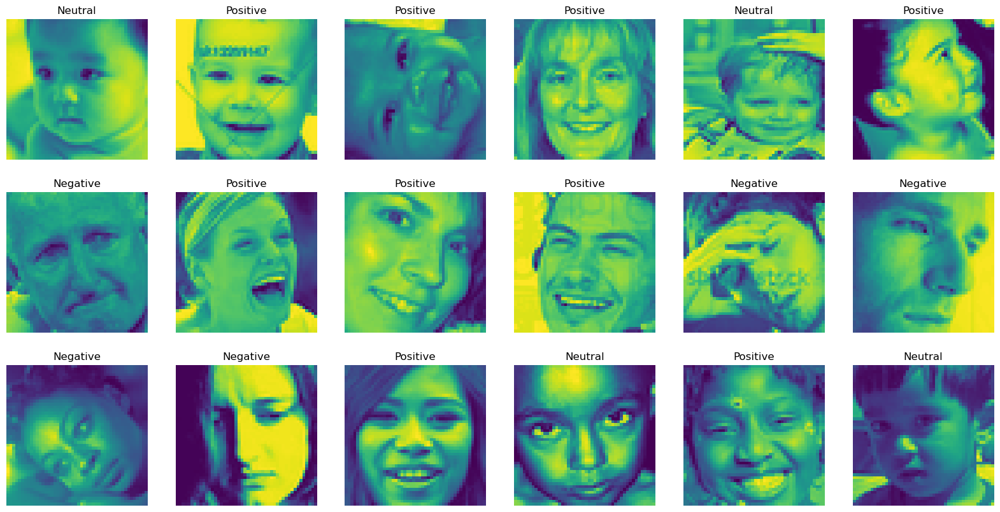

In [97]:
# Name of the classes
class_names = ['Positive','Negative','Neutral']

# Plotting the images
plt.figure(figsize=(20,10))
for i in range(18):
    plt.subplot(3, 6, i+1)
    class_name = random.choice(class_names)
    img = view_random_image(target_dir="/Users/akshaymohan/Downloads/Emotion_Detection/train/", target_class=class_name)

In [98]:
from keras.preprocessing.image import ImageDataGenerator

# Create an ImageDataGenerator for training data
train_datagen = ImageDataGenerator(rescale=1./255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

# Create an ImageDataGenerator for testing data
test_datagen = ImageDataGenerator(rescale=1./255)

# Create data generators for training and testing sets
training_set = train_datagen.flow_from_directory(TRAIN_DIR,
                                                 target_size=(128, 128),
                                                 batch_size=BATCH_SIZE,
                                                 class_mode='categorical')

test_set = test_datagen.flow_from_directory(TEST_DIR,
                                            target_size=(128, 128),
                                            batch_size=BATCH_SIZE,
                                            class_mode='categorical')


Found 17010 images belonging to 3 classes.
Found 4254 images belonging to 3 classes.


In [99]:
# Initialising the CNN
classifier = Sequential()

# Step 1 - Convolution
classifier.add(Conv2D(16, (3, 3), input_shape = (128, 128, 3), activation = 'relu'))

# Step 2 - Pooling
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Adding a second convolutional layer
classifier.add(Conv2D(32, (3, 3), activation = 'relu'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Step 3 - Flattening
classifier.add(Flatten())

# Step 4 - Full connection
classifier.add(Dense(units = 128, activation = 'relu'))
classifier.add(Dense(units = 3, activation = 'softmax'))

# Compiling the CNN
classifier.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

# Model summary
classifier.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 28800)             0         
                                                                 
 dense_6 (Dense)             (None, 128)              

In [100]:
# Fit the model to the training data and validate on the test data
history = classifier.fit(training_set,
                         epochs=50,
                         validation_data=test_set)

# Saving the model into a specific folder
classifier.save('/Users/akshaymohan/Downloads/Emotion_Detection/model1.h5')


Epoch 1/50
266/266 [==============================] - 39s 147ms/step - loss: 1.0299 - accuracy: 0.5009 - val_loss: 0.9234 - val_accuracy: 0.5616
Epoch 2/50
266/266 [==============================] - 43s 161ms/step - loss: 0.9210 - accuracy: 0.5607 - val_loss: 0.8923 - val_accuracy: 0.5731
Epoch 3/50
266/266 [==============================] - 47s 178ms/step - loss: 0.8619 - accuracy: 0.5956 - val_loss: 0.8250 - val_accuracy: 0.6142
Epoch 4/50
266/266 [==============================] - 50s 186ms/step - loss: 0.8273 - accuracy: 0.6158 - val_loss: 0.8037 - val_accuracy: 0.6272
Epoch 5/50
266/266 [==============================] - 50s 187ms/step - loss: 0.7967 - accuracy: 0.6339 - val_loss: 0.7664 - val_accuracy: 0.6370
Epoch 6/50
266/266 [==============================] - 53s 200ms/step - loss: 0.7638 - accuracy: 0.6466 - val_loss: 0.7541 - val_accuracy: 0.6559
Epoch 7/50
266/266 [==============================] - 52s 195ms/step - loss: 0.7431 - accuracy: 0.6612 - val_loss: 0.7384 - val_ac

/opt/anaconda3/lib/python3.9/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [101]:
# Evaluating
classifier.evaluate(test_set)

67/67 [==============================] - 3s 48ms/step - loss: 0.8566 - accuracy: 0.6963


[0.8566327095031738, 0.6962858438491821]

Text(0, 0.5, 'Loss')

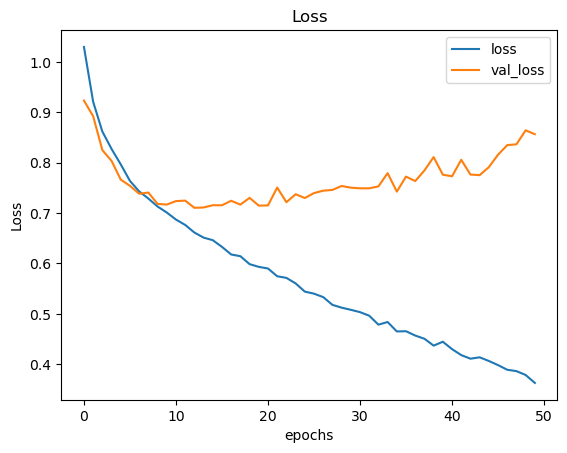

In [102]:
# Creating a DataFrame from history and plotting loss values
pd.DataFrame(history.history)[['loss','val_loss']].plot()

# Adding title and labels to the plot
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('Loss')


Text(0, 0.5, 'Accuracy')

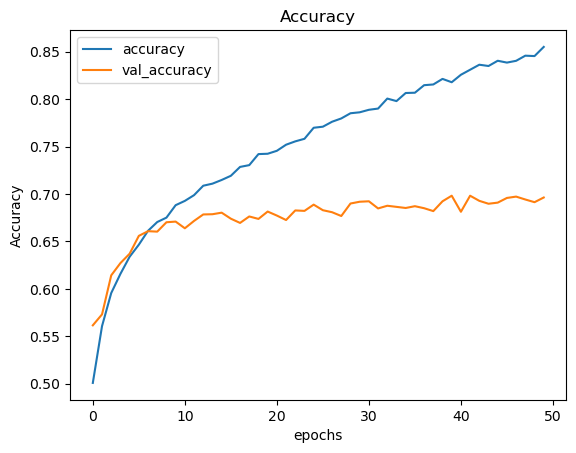

In [103]:
# Creating a DataFrame from history and plotting accuracy values
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()

# Adding title and labels to the plot
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('Accuracy')


# Testing

In [104]:
model_path = "/Users/akshaymohan/Downloads/Emotion_Detection/model1.h5"
loaded_model = keras.models.load_model(model_path)

import numpy as np
import cv2
from PIL import Image

# Load an image for prediction
image = cv2.imread("/Users/akshaymohan/Downloads/Emotion_Detection/test/Neutral/im1001.png")

# Convert the OpenCV image to PIL format
image_fromarray = Image.fromarray(image, 'RGB')

# Resize the image to match the input size of the model (128x128)
resize_image = image_fromarray.resize((128, 128))

# Expand the dimensions of the image for model input
expand_input = np.expand_dims(resize_image, axis=0)
input_data = np.array(expand_input)
input_data = input_data / 255

# Perform prediction using the loaded model
pred = loaded_model.predict(input_data)

# Get the index of the predicted class (sentiment/emotion)
result = pred.argmax()
result


1/1 [==============================] - 0s 31ms/step


1

In [105]:
# Class indices
training_set.class_indices

{'Negative': 0, 'Neutral': 1, 'Positive': 2}

# Downloading the YouTube Video

In [106]:
# Import pytube library
try:
  import pytube
except:
  !pip install pytube
  import pytube


# Create a YouTube object
# url from the sentimental analysis on text
yt = pytube.YouTube(url)

# Get the highest resolution stream
stream = yt.streams.get_highest_resolution()

# Download the video with the specified name and directory
stream.download(filename="video1.mp4", output_path="/Users/akshaymohan/Downloads/Emotion_Detection")

'/Users/akshaymohan/Downloads/Emotion_Detection/video1.mp4'

# Sentimental Analysis and exporting the result

In [107]:
# Path of the video to be analyzed
video_path_v1 = "/Users/akshaymohan/Downloads/Emotion_Detection/video1.mp4"

# Open the video file
video = cv2.VideoCapture(video_path_v1)

if not video.isOpened():
    print("Error: Could not open the video file.")
else:
    # Get the total frames in the video
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

    # Get the frames per second (fps)
    fps = int(video.get(cv2.CAP_PROP_FPS))

    # Calculate the duration of the video in seconds
    duration_seconds = total_frames / fps

    print(f"Video Duration: {duration_seconds:.2f} seconds")

    # Release the video object
    video.release()


Video Duration: 1279.08 seconds


In [108]:
duration_seconds

1279.08

In [109]:

import time # Import time library

#model_path = '/content/drive/MyDrive/main_project/Emotion_Detection/model1.h5'
#loaded_model = keras.models.load_model(model_path)

video = cv2.VideoCapture(video_path_v1)

# Create an empty dataframe with two columns: result and time
data_table = pd.DataFrame(columns=["result", "time"])

while True:
    success, frame = video.read()
    if not success:
        break

    image_fromarray = Image.fromarray(frame, 'RGB')
    resize_image = image_fromarray.resize((128, 128))
    expand_input = np.expand_dims(resize_image, axis=0)
    input_data = np.array(expand_input)
    input_data = input_data / 255

    # Record the start time of the prediction
    start_time = time.time()
    # Set verbose to 0 to suppress the progress bar output
    pred = loaded_model.predict(input_data, verbose=0)
    # Record the end time of the prediction
    end_time = time.time()

    result = pred.argmax()

    # Calculate the elapsed time in milliseconds
    elapsed_time = (end_time - start_time) * 1000

    # Append the result and the elapsed time to the dataframe
    data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)

    # Print the result and the elapsed time in the desired format
    print(f"{result}\n{elapsed_time:.0f} ms/step\n")

video.release()


0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
25 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
24 ms/step

0
20 ms/step

0
21 ms/step

0
27 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

0
22 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
25 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
45 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
21 ms/step

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
27 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
25 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
23 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
25 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
21 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
24 ms/step

2
25 ms/step

2
26 ms/step

2
25 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
27 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
25 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
38 ms/step

0
24 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
22 ms/step

2
20 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

1
20 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
22 ms/step

1
20 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
22 ms/step

1
20 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
20 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
23 ms/step

1
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
314 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
34 ms/step

0
24 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
20 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
20 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

0
20 ms/step

2
20 ms/step

2
22 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
20 ms/step

2
20 ms/step

0
20 ms/step

2
20 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

0
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
20 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
20 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
20 ms/step

1
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
20 ms/step

0
20 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

2
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
20 ms/step

2
20 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

0
22 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
24 ms/step

0
20 ms/step

0
21 ms/step

1
21 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

1
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

1
22 ms/step

1
20 ms/step

0
21 ms/step

0
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
22 ms/step

1
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
47 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
25 ms/step

1
35 ms/step

1
25 ms/step

1
21 ms/step

0
21 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step

0
20 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
20 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


2
20 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
229 ms/step

2
20 ms/step

0
20 ms/step

2
21 ms/step

1
20 ms/step

2
21 ms/step

2
22 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

1
21 ms/step

2
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
28 ms/step

2
33 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
24 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
20 ms/step

2
24 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
30 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
20 ms/step

2
23 ms/step

2
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
20 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

1
22 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
21 ms/step

1
20 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
20 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

1
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

2
21 ms/step

2
22 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
20 ms/step

0
20 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

1
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

1
20 ms/step

1
21 ms/step

1
20 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

2
20 ms/step

1
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

2
22 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step

1
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
20 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

1
21 ms/step

0
20 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

0
20 ms/step

1
20 ms/step

1
20 ms/step

2
20 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
20 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

0
20 ms/step

0
20 ms/step

1
22 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step

1
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
22 ms/step

2
20 ms/step

1
21 ms/step

1
21 ms/step

0
20 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
20 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
20 ms/step

0
20 ms/step

2
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
38 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
26 ms/step

0
26 ms/step

0
27 ms/step

0
26 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
29 ms/step

0
25 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
26 ms/step

0
29 ms/step

0
23 ms/step

0
25 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
26 ms/step

1
30 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
25 ms/step

1
23 ms/step

1
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
24 ms/step

1
38 ms/step

1
40 ms/step

1
40 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
31 ms/step

1
22 ms/step

1
22 ms/step

1
33 ms/step

1
60 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
46 ms/step

1
37 ms/step

1
27 ms/step

0
27 ms/step

0
37 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
77 ms/step

0
24 ms/step

0
26 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
42 ms/step

0
32 ms/step

0
28 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
26 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
28 ms/step

0
23 ms/step

0
23 ms/step

0
23 ms/step

0
23 ms/step

0
24 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
23 ms/step

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
40 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
34 ms/step

0
22 ms/step

0
22 ms/step

0
27 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

1
27 ms/step

1
28 ms/step

1
28 ms/step

1
44 ms/step

1
27 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

1
21 ms/step

1
24 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
279 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

0
22 ms/step

0
22 ms/step

2
23 ms/step

0
22 ms/step

0
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
23 ms/step

2
22 ms/step

0
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
25 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
28 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
24 ms/step

2
26 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

0
23 ms/step

2
23 ms/step

0
23 ms/step

2
26 ms/step

0
24 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step

2
21 ms/step

0
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
38 ms/step

2
82 ms/step

2
38 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
53 ms/step

2
41 ms/step

2
32 ms/step

2
33 ms/step

2
28 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
27 ms/step

2
27 ms/step

2
25 ms/step

0
25 ms/step

2
25 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
28 ms/step

2
33 ms/step

2
35 ms/step

2
26 ms/step

2
25 ms/step

2
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
25 ms/step

0
25 ms/step

2
27 ms/step

0
26 ms/step

0
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

2
25 ms/step

2
25 ms/step

2
29 ms/step

2
27 ms/step

2
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
25 ms/step

2
25 ms/step

2
28 ms/step

2
25 ms/step

2
25 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
25 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
33 ms/step

2
24 ms/step

2
29 ms/step

0
24 ms/step

0
24 ms/step

0
25 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
22 ms/step

1
23 ms/step

1
24 ms/step

1
24 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
24 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
24 ms/step

1
24 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
32 ms/step

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
27 ms/step

0
28 ms/step

0
31 ms/step

0
29 ms/step

0
29 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
31 ms/step

0
30 ms/step

0
31 ms/step

0
31 ms/step

1
29 ms/step

0
28 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
31 ms/step

0
29 ms/step

0
28 ms/step

0
31 ms/step

0
29 ms/step

0
29 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
30 ms/step

0
28 ms/step

0
29 ms/step

0
31 ms/step

0
29 ms/step

0
29 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
30 ms/step

0
29 ms/step

0
28 ms/step

0
31 ms/step

0
29 ms/step

0
29 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
30 ms/step

0
33 ms/step

0
28 ms/step

0
31 ms/step

0
27 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

0
24 ms/step

0
23 ms/step

0
25 ms/step

0
26 ms/step

0
29 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
25 ms/step

0
24 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
25 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step

1
23 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
28 ms/step

1
24 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
25 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
29 ms/step

1
24 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
30 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
24 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
31 ms/step

1
24 ms/step

1
21 ms/step

1
25 ms/step

1
23 ms/step

1
23 ms/step

1
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
32 ms/step

1
30 ms/step

1
32 ms/step

1
31 ms/step

1
30 ms/step

1
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
24 ms/step

2
21 ms/step

2
23 ms/step

2
23 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
25 ms/step

2
23 ms/step

2
22 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
25 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
23 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
23 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
23 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
25 ms/step

2
23 ms/step

2
22 ms/step

2
23 ms/step

2
23 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
25 ms/step

2
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
26 ms/step

2
25 ms/step

2
23 ms/step

2
24 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
25 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
24 ms/step

2
23 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
23 ms/step

2
21 ms/step

2
25 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
22 ms/step

0
23 ms/step

0
24 ms/step

0
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

1
22 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step

2
26 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
23 ms/step

0
107 ms/step

0
27 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
25 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

2
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
27 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
25 ms/step

0
22 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

0
21 ms/step

2
23 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

2
23 ms/step

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
24 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
465 ms/step

2
32 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
25 ms/step

2
33 ms/step

2
26 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
23 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
25 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
41 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
32 ms/step

2
28 ms/step

2
22 ms/step

2
23 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
24 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
28 ms/step

2
37 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
53 ms/step

2
25 ms/step

2
29 ms/step

2
25 ms/step

2
25 ms/step

2
45 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
27 ms/step

1
23 ms/step

1
23 ms/step

1
23 ms/step

1
22 ms/step

1
24 ms/step

1
37 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
29 ms/step

1
24 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
25 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
24 ms/step

2
24 ms/step

1
22 ms/step

1
24 ms/step

2
21 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
25 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
24 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
24 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
23 ms/step

1
22 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
89 ms/step

2
28 ms/step

2
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
38 ms/step

2
32 ms/step

2
33 ms/step

2
28 ms/step

2
27 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
27 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
47 ms/step

1
22 ms/step

1
22 ms/step

1
24 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
24 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
30 ms/step

2
21 ms/step

2
26 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
23 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
25 ms/step

2
30 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
39 ms/step

2
30 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
33 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
26 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
25 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
27 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
26 ms/step

2
33 ms/step

2
28 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
24 ms/step

2
22 ms/step

2
25 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
28 ms/step

2
26 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
28 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
27 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
21 ms/step

0
25 ms/step

0
25 ms/step

2
25 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

2
24 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

0
26 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step

1
34 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
369 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
22 ms/step

1
27 ms/step

2
29 ms/step

1
27 ms/step

1
22 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

1
23 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

1
20 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

0
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
22 ms/step

1
25 ms/step

0
30 ms/step

0
25 ms/step

0
31 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
28 ms/step

2
23 ms/step

1
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step

1
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
25 ms/step

1
24 ms/step

1
21 ms/step

0
24 ms/step

1
25 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
41 ms/step

0
35 ms/step

0
29 ms/step

0
23 ms/step

1
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
30 ms/step

0
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
25 ms/step

0
21 ms/step

0
26 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

0
25 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
20 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
44 ms/step

2
59 ms/step

2
28 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
25 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
23 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
250 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
78 ms/step

1
27 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
25 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

1
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step

1
21 ms/step

1
20 ms/step

0
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
25 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
21 ms/step

0
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
263 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
41 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
80 ms/step

0
33 ms/step

0
27 ms/step

0
26 ms/step

0
23 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
32 ms/step

0
22 ms/step

0
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
40 ms/step

1
22 ms/step

1
22 ms/step

1
25 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

1
20 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
20 ms/step

0
22 ms/step

0
20 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
34 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
45 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
46 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
40 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
35 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
382 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
39 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
42 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
27 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
28 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
23 ms/step

0
28 ms/step

0
25 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
26 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
24 ms/step

0
29 ms/step

0
39 ms/step

0
24 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
25 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
47 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
310 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

2
21 ms/step

1
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

1
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

1
20 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
26 ms/step

2
27 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
20 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

1
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
23 ms/step

2
22 ms/step

1
25 ms/step

2
21 ms/step

2
26 ms/step

2
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
24 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

0
22 ms/step

0
23 ms/step

0
24 ms/step

0
26 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
24 ms/step

0
23 ms/step

0
23 ms/step

0
25 ms/step

0
23 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

1
22 ms/step

1
22 ms/step

1
25 ms/step

1
23 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
23 ms/step

1
25 ms/step

1
23 ms/step

1
23 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
23 ms/step

1
23 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
25 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
26 ms/step

0
26 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
71 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
28 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
60 ms/step

0
27 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
23 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
25 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
264 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
24 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
22 ms/step

2
25 ms/step

2
28 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
116 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
22 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
20 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

2
21 ms/step

0
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

1
21 ms/step

1
27 ms/step

1
22 ms/step

1
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

2
24 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
44 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
22 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
34 ms/step

2
27 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
380 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

0
24 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
24 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
20 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
20 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
26 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
63 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
29 ms/step

0
23 ms/step

0
23 ms/step

0
24 ms/step

0
22 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
35 ms/step

0
37 ms/step

0
27 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
24 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
26 ms/step

1
30 ms/step

1
48 ms/step

1
42 ms/step

1
36 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
39 ms/step

1
44 ms/step

1
43 ms/step

1
68 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
51 ms/step

1
40 ms/step

1
52 ms/step

1
39 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
33 ms/step

1
26 ms/step

1
22 ms/step

1
21 ms/step

1
27 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
27 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
411 ms/step

2
24 ms/step

2
25 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
24 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
23 ms/step

2
25 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
26 ms/step

2
24 ms/step

0
21 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
28 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
23 ms/step

0
23 ms/step

0
23 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
24 ms/step

0
24 ms/step

0
23 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
25 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
30 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
22 ms/step

0
21 ms/step

0
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
23 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
24 ms/step

2
27 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

1
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

0
21 ms/step

2
21 ms/step

1
21 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
25 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
31 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
31 ms/step

2
31 ms/step

2
21 ms/step

2
21 ms/step

0
23 ms/step

0
24 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

2
23 ms/step

2
21 ms/step

1
24 ms/step

1
21 ms/step

2
21 ms/step

2
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
26 ms/step

2
22 ms/step

2
25 ms/step

2
22 ms/step

2
21 ms/step

1
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
23 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
22 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
37 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
25 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
25 ms/step

2
25 ms/step

2
25 ms/step

2
26 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
26 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

2
24 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
30 ms/step

2
25 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
23 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

1
21 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
29 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
22 ms/step

2
29 ms/step

2
25 ms/step

2
24 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
84 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
22 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
20 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
21 ms/step

1
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
296 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
25 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
25 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
24 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

0
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
23 ms/step

2
23 ms/step

2
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

1
22 ms/step

1
22 ms/step

2
21 ms/step

2
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
23 ms/step

1
21 ms/step

2
21 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
22 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

1
21 ms/step

1
100 ms/step

2
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
25 ms/step

1
31 ms/step

2
44 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
32 ms/step

2
32 ms/step

2
32 ms/step

2
25 ms/step

2
26 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
25 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

2
24 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
23 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
25 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
25 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
300 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
27 ms/step

2
30 ms/step

2
37 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
25 ms/step

0
29 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
28 ms/step

0
25 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
28 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
32 ms/step

2
29 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


0
22 ms/step

0
27 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


0
245 ms/step

0
149 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


0
40 ms/step

0
165 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
48 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
25 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
27 ms/step

2
28 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
28 ms/step

2
23 ms/step

2
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
27 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
25 ms/step

0
27 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
27 ms/step

0
24 ms/step

0
29 ms/step

0
26 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
25 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
23 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
79 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
25 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
361 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

1
21 ms/step

1
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

1
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
95 ms/step

0
25 ms/step

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
27 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
260 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

2
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
24 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

2
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
36 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

2
21 ms/step

2
25 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
29 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
25 ms/step

2
22 ms/step

2
26 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
25 ms/step

2
24 ms/step

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
28 ms/step

0
48 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
24 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
83 ms/step

0
58 ms/step

1
22 ms/step

1
23 ms/step

1
23 ms/step

1
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
22 ms/step

0
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
23 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
60 ms/step

1
30 ms/step

1
28 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
21 ms/step

2
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
25 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
23 ms/step

1
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
26 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
24 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
29 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step

1
34 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
22 ms/step

1
22 ms/step

1
35 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
25 ms/step

1
23 ms/step

1
31 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
26 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
23 ms/step

2
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
25 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
23 ms/step

2
23 ms/step

2
25 ms/step

2
24 ms/step

2
24 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
24 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step

2
23 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
25 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
24 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
25 ms/step

0
22 ms/step

0
25 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
26 ms/step

0
22 ms/step

0
23 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
24 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step

1
24 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
21 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step

1
21 ms/step

0
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
66 ms/step

1
28 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
24 ms/step

1
25 ms/step

1
25 ms/step

1
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
353 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
26 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

1
22 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
25 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step

2
23 ms/step

2
24 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
25 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
24 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
23 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

2
21 ms/step

1
23 ms/step

1
101 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
28 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
23 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
23 ms/step

1
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

1
21 ms/step

0
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
25 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

1
24 ms/step

1
22 ms/step

1
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
23 ms/step

1
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
24 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
268 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
25 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
25 ms/step

2
24 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
24 ms/step

1
24 ms/step

1
23 ms/step

1
23 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step

2
24 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
49 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
24 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
42 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
317 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
23 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
25 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
25 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
21 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

0
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
23 ms/step

2
23 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
25 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
26 ms/step

2
23 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

1
22 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

1
22 ms/step

2
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step

1
23 ms/step

1
24 ms/step

1
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
22 ms/step

0
21 ms/step

1
24 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
24 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

0
22 ms/step

1
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

1
24 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

0
24 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

1
25 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
23 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
23 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

0
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
20 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
20 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
268 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

1
22 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

2
23 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
27 ms/step

0
25 ms/step

0
25 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

2
22 ms/step

1
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

1
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
288 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
76 ms/step

0
22 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
124 ms/step

2
25 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
23 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
23 ms/step

1
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

1
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

0
21 ms/step

2
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
27 ms/step

2
31 ms/step

2
28 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
28 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
25 ms/step

2
30 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

1
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
264 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

0
71 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
74 ms/step

0
24 ms/step

1
22 ms/step

0
27 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

1
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

1
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
21 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
28 ms/step

1
40 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
27 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
25 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
25 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
24 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
22 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

1
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
28 ms/step

2
26 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step

1
28 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
26 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
20 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
365 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
40 ms/step

1
25 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

1
23 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
23 ms/step

2
22 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

0
21 ms/step

2
21 ms/step

2
20 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

1
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step

2
23 ms/step

1
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
70 ms/step

1
31 ms/step

1
29 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
25 ms/step

1
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

2
21 ms/step

1
21 ms/step

0
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
262 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

1
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
20 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

0
20 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
279 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
25 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
26 ms/step

0
59 ms/step

0
25 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
25 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
22 ms/step

2
24 ms/step

2
21 ms/step

2
23 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
23 ms/step

0
22 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
24 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

1
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
275 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

0
26 ms/step

0
24 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
24 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
53 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

2
23 ms/step

1
21 ms/step

1
22 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
27 ms/step

2
27 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
25 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
21 ms/step

0
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
24 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

2
21 ms/step

0
22 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

2
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

1
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
36 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
55 ms/step

1
48 ms/step

1
35 ms/step

1
27 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
22 ms/step

1
22 ms/step

1
32 ms/step

1
24 ms/step

1
22 ms/step

1
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
22 ms/step

1
31 ms/step

1
30 ms/step

1
23 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


0
22 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
368 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
26 ms/step

0
28 ms/step

0
25 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
23 ms/step

0
23 ms/step

2
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

2
21 ms/step

0
21 ms/step

0
25 ms/step

0
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
30 ms/step

0
27 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
70 ms/step

0
59 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
32 ms/step

0
27 ms/step

0
25 ms/step

0
25 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
66 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
25 ms/step

0
25 ms/step

0
36 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
27 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
38 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
26 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

2
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
23 ms/step

2
25 ms/step

2
27 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
24 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
27 ms/step

2
23 ms/step

2
24 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
24 ms/step

2
23 ms/step

2
22 ms/step

2
24 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
23 ms/step

2
22 ms/step

2
23 ms/step

2
24 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

1
24 ms/step

1
21 ms/step

1
26 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
23 ms/step

2
24 ms/step

2
27 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
24 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

1
22 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
23 ms/step

1
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
54 ms/step

2
61 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
24 ms/step

0
23 ms/step

0
23 ms/step

0
26 ms/step

0
23 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
25 ms/step

0
26 ms/step

0
24 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
24 ms/step

2
22 ms/step

0
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

0
21 ms/step

0
21 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

2
22 ms/step

2
22 ms/step

2
25 ms/step

2
23 ms/step

1
25 ms/step

1
27 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
24 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
351 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
24 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
24 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
22 ms/step

2
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
25 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

0
23 ms/step

0
23 ms/step

0
26 ms/step

0
26 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
24 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

2
29 ms/step

2
35 ms/step

2
25 ms/step

2
24 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
23 ms/step

2
23 ms/step

2
22 ms/step

2
22 ms/step

2
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
69 ms/step

0
24 ms/step

0
34 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

2
22 ms/step

1
23 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
20 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
22 ms/step

2
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
25 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

1
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
24 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step

1
31 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
48 ms/step

1
26 ms/step

1
24 ms/step

1
28 ms/step

2
39 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
28 ms/step

2
32 ms/step

2
55 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

0
20 ms/step

2
22 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
20 ms/step

2
20 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
24 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
20 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
27 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
374 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
29 ms/step

0
27 ms/step

0
23 ms/step

0
25 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
24 ms/step

0
23 ms/step

0
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)


0
50 ms/step

0
54 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
250 ms/step

0
57 ms/step

0
27 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
25 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
24 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
24 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

0
22 ms/step

0
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
27 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
28 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
25 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
36 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
24 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
24 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

0
23 ms/step

1
21 ms/step

0
21 ms/step

1
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
25 ms/step

0
23 ms/step

0
22 ms/step

0
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
38 ms/step

0
49 ms/step

0
25 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
24 ms/step

0
23 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
22 ms/step

1
24 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
25 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
24 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step

1
24 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
23 ms/step

1
23 ms/step

1
22 ms/step

1
24 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

0
21 ms/step

1
23 ms/step

2
22 ms/step

2
21 ms/step

0
22 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step

2
21 ms/step

2
23 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

0
21 ms/step

0
25 ms/step

1
22 ms/step

1
26 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
31 ms/step

1
24 ms/step

1
29 ms/step

1
26 ms/step

1
27 ms/step

1
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
26 ms/step

1
27 ms/step

1
28 ms/step

1
25 ms/step

1
26 ms/step

1
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
25 ms/step

1
25 ms/step

1
27 ms/step

1
26 ms/step

1
26 ms/step

1
25 ms/step

1
26 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
24 ms/step

1
22 ms/step

1
22 ms/step

0
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

0
22 ms/step

0
25 ms/step

0
22 ms/step

0
27 ms/step

0
22 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
22 ms/step

1
24 ms/step

1
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
23 ms/step

0
23 ms/step

0
24 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
23 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
24 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
23 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
24 ms/step

0
24 ms/step

0
22 ms/step

0
23 ms/step

0
24 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
29 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
50 ms/step

0
22 ms/step

0
23 ms/step

0
23 ms/step

0
24 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
24 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
25 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
24 ms/step

0
31 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
41 ms/step

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
21 ms/step

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
23 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
22 ms/step

2
25 ms/step

2
22 ms/step

2
22 ms/step

2
22 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
21 ms/step

2
23 ms/step

2
21 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
24 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
23 ms/step

2
21 ms/step

2
22 ms/step

2
21 ms/step

2
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
361 ms/step

2
23 ms/step

2
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
26 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

0
25 ms/step

0
25 ms/step

0
24 ms/step

0
28 ms/step

0
24 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
23 ms/step

0
26 ms/step

0
28 ms/step

0
23 ms/step

0
25 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
26 ms/step

0
26 ms/step

1
23 ms/step

1
24 ms/step

1
23 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
28 ms/step

1
26 ms/step

1
23 ms/step

1
30 ms/step

1
22 ms/step

1
25 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

1
30 ms/step

1
23 ms/step

2
24 ms/step

1
29 ms/step

1
23 ms/step

1
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
29 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

2
22 ms/step

2
24 ms/step

2
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
25 ms/step

0
23 ms/step

2
24 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
21 ms/step

1
24 ms/step

1
23 ms/step

0
27 ms/step

0
23 ms/step

0
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
27 ms/step

0
27 ms/step

0
23 ms/step

1
30 ms/step

1
22 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
22 ms/step

1
21 ms/step

1
22 ms/step

1
23 ms/step

1
22 ms/step

1
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
28 ms/step

1
23 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
24 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

1
21 ms/step

1
23 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
25 ms/step

1
27 ms/step

1
25 ms/step

1
24 ms/step

1
24 ms/step

1
25 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
22 ms/step

0
24 ms/step

0
22 ms/step

1
23 ms/step

1
23 ms/step

1
27 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
24 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
20 ms/step

1
21 ms/step

1
23 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

2
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

2
22 ms/step

1
22 ms/step

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
23 ms/step

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step

1
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
23 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
21 ms/step

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

1
23 ms/step

1
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

1
22 ms/step

1
22 ms/step

1
21 ms/step

1
21 ms/step

0
24 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
27 ms/step

0
21 ms/step

2
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
25 ms/step

0
24 ms/step

0
26 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
24 ms/step

0
24 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
20 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
20 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
20 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
28 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
34 ms/step

0
25 ms/step

0
26 ms/step

0
24 ms/step

0
23 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
25 ms/step

0
21 ms/step

0
21 ms/step

0
27 ms/step

0
22 ms/step

0
22 ms/step

0
24 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
24 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
23 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
26 ms/step

0
23 ms/step

0
23 ms/step

0
24 ms/step

0
22 ms/step

0
24 ms/step

0
27 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
23 ms/step

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
24 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
23 ms/step

0
22 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
23 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
21 ms/step

0
22 ms/step



/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/3906025820.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_table = data_table.append({"result": result, "time": elapsed_time}, ignore_index=True)
/var/folders/0f/sw31x3dd36s4krytg_r3wzv40000gn/T/ipykernel_99272/39060

In [110]:

# Define a function that takes the time value as an input and returns the calculated value as an output
def calculate_approx_time(time):

  # Get the sum of the time column
  total_time = data_table["time"].sum()
  # Calculate the approx_time value using the formula
  approx_time = ((duration_seconds / total_time) * time)
  # Return the approx_time value
  return approx_time

# Apply the function to each row of the dataframe and assign the result to a new column called approx_time
data_table["approx_time"] = data_table["time"].apply(calculate_approx_time)


# Use the cumsum method to get the cumulative sum of the approx_time column and assign it to a new column called cumsum_approx_time
data_table["cumsum_approx_time"] = data_table["approx_time"].cumsum()

# Save the dataframe as an excel file with a specific name and directory
#data_table.to_excel("/content/drive/MyDrive/main_project/result_and_time.xlsx", index=False)
data_table.head(10)

,result,time,approx_time,cumsum_approx_time
0,0.0,22.089958,0.040428,0.040428
1,0.0,21.193981,0.038788,0.079216
2,0.0,21.033049,0.038493,0.117709
3,0.0,20.552158,0.037613,0.155322
4,0.0,21.616936,0.039562,0.194884
5,0.0,21.968126,0.040205,0.235089
6,0.0,21.029949,0.038488,0.273576
7,0.0,20.379305,0.037297,0.310873
8,0.0,25.269985,0.046248,0.357121
9,0.0,21.376133,0.039121,0.396242


In [111]:
# Calculations for combining the texts from every 5 seconds of the video.
time_vid = data_table["cumsum_approx_time"]

Time_in_3s=[]
  # Writing the calculations into the dataset.

for i in time_vid:
    cal_new = i - (i%3)
    if (cal_new % 3) == 0 :
        Time_in_3s.append(cal_new)
    else:
        Time_in_3s.append(0)

data_table['Time_in_3s'] = Time_in_3s
# Displays the dataset
data_table.tail(100)


,result,time,approx_time,cumsum_approx_time,Time_in_3s
31877,0.0,26.065826,0.047704,1275.149904,1275.0
31878,0.0,22.728920,0.041597,1275.191501,1275.0
31879,0.0,22.647858,0.041449,1275.232950,1275.0
31880,0.0,23.668051,0.043316,1275.276266,1275.0
31881,0.0,22.058010,0.040369,1275.316635,1275.0
...,...,...,...,...,...
31972,0.0,21.026134,0.038481,1278.923988,1278.0
31973,0.0,20.915747,0.038279,1278.962267,1278.0
31974,0.0,21.168232,0.038741,1279.001007,1278.0
31975,0.0,20.802021,0.038071,1279.039078,1278.0


In [112]:

# Group by the "time" column and calculate the mean of the "result" column for each group
result_mean_by_time = data_table.groupby('Time_in_3s')['result'].mean().reset_index()

result_mean_by_time


,Time_in_3s,result
0,0.0,0.000000
1,3.0,0.000000
2,6.0,0.000000
3,9.0,0.210526
4,12.0,1.386667
...,...,...
422,1266.0,0.000000
423,1269.0,0.000000
424,1272.0,0.000000
425,1275.0,0.000000


In [113]:
score_data = result_mean_by_time['result'].values

# Setting threshold values for the compound score.
sentiment=[]
for i in score_data:
    if i >= 1.5:
        sentiment.append('positive')
    elif i<= 0.5:
        sentiment.append('negative')
    else:
        sentiment.append('neutral')

result_mean_by_time['Sentiment'] =sentiment
result_mean_by_time.head(15)


,Time_in_3s,result,Sentiment
0,0.0,0.000000,negative
1,3.0,0.000000,negative
2,6.0,0.000000,negative
3,9.0,0.210526,negative
4,12.0,1.386667,neutral
5,15.0,0.797468,neutral
6,18.0,2.000000,positive
7,21.0,1.240506,neutral
8,24.0,0.063291,negative
9,27.0,1.423077,neutral


In [114]:
# Print the number of values for each sentiment.
print(result_mean_by_time['Sentiment'].value_counts())

neutral     164
negative    163
positive    100
Name: Sentiment, dtype: int64


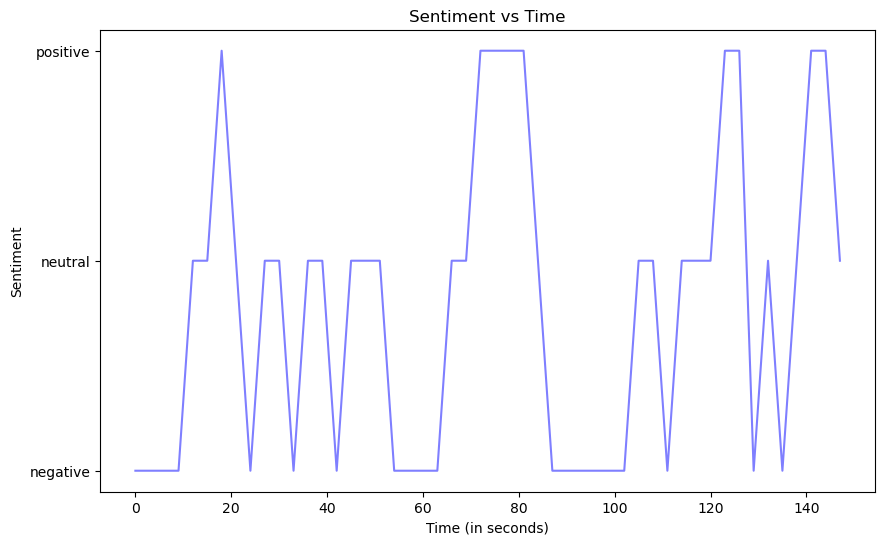

In [115]:
# Create a scatter plot between "result" and "cumsum_approx_time"
plt.figure(figsize=(10, 6))
plt.plot( result_mean_by_time["Time_in_3s"].head(50), result_mean_by_time["Sentiment"].head(50), color='blue', alpha=0.5)

# Set labels and title
plt.xlabel("Time (in seconds)")
plt.ylabel("Sentiment")
plt.title("Sentiment vs Time")

# Show the plot
plt.show()


## Combining Text and Video Sentiment Results

In [116]:
# To combine and compare the result we got from the video analysis,
# we must convert the sentiment values into integers as in analysis on text.

# Define a mapping from labels to numerical values
sen_mapping = { 'neutral': 0, 'positive': 1, 'negative': 2}

# Use the map function to replace labels with numerical values
result_mean_by_time['Video_Emotion'] = result_mean_by_time['Sentiment'].map(sen_mapping)

# Print the updated DataFrame
result_mean_by_time


,Time_in_3s,result,Sentiment,Video_Emotion
0,0.0,0.000000,negative,2
1,3.0,0.000000,negative,2
2,6.0,0.000000,negative,2
3,9.0,0.210526,negative,2
4,12.0,1.386667,neutral,0
...,...,...,...,...
422,1266.0,0.000000,negative,2
423,1269.0,0.000000,negative,2
424,1272.0,0.000000,negative,2
425,1275.0,0.000000,negative,2


In [117]:
result_mean_by_time.tail(50)

,Time_in_3s,result,Sentiment,Video_Emotion
377,1131.0,0.029851,negative,2
378,1134.0,0.273973,negative,2
379,1137.0,0.368421,negative,2
380,1140.0,1.573333,positive,1
381,1143.0,2.000000,positive,1
382,1146.0,1.946667,positive,1
383,1149.0,1.917808,positive,1
384,1152.0,0.575342,neutral,0
385,1155.0,0.623377,neutral,0
386,1158.0,1.320000,neutral,0


In [118]:
# Merge mean_df's 'Video_Emotion' column into merged_df based on matching 'Time' and 'Time_in_3s'
result_df = merged_df.merge(result_mean_by_time[['Time_in_3s', 'Video_Emotion']], left_on='Time', right_on='Time_in_3s', how='left')

# Drop the 'Time_in_3s' column from the merged DataFrame if needed
result_df.drop(columns=['Time_in_3s'], inplace=True)

# Print the merged DataFrame
print(result_df)



     Sl.No.    Time                                             Speech  \
0         1     0.0  so you could blow a grand or even more on a sh...   
1         2     3.0               expensive Flagship blower or you can   
2         3     6.0           save yourself a packet and stuff for one   
3         4     9.0  of the best mid-range mobiles instead because ...   
4         5    12.0            Google nothing and OnePlus offer phones   
..      ...     ...                                                ...   
415     416  1248.0  unless it's the iPhone SE because that is fran...   
416     417  1251.0            the meantime please do POG subscribe to   
417     418  1254.0  that notifications Bell have yourselves alread...   
418     419  1257.0      I'll see you on the flip side cheers love you   
419     420  1260.0                                          thank you   

     roBERTa_Sentiment  Vader_Sentiment  LSTM_sentiment  CNN_sentiment  \
0                    0               

In [119]:
result_df

,Sl.No.,Time,Speech,roBERTa_Sentiment,Vader_Sentiment,LSTM_sentiment,CNN_sentiment,SimpleNN_sentiment,Video_Emotion
0,1,0.0,so you could blow a grand or even more on a sh...,0,1,0,0,0,2
1,2,3.0,expensive Flagship blower or you can,0,1,0,0,0,2
2,3,6.0,save yourself a packet and stuff for one,0,1,0,0,1,2
3,4,9.0,of the best mid-range mobiles instead because ...,1,1,1,1,2,2
4,5,12.0,Google nothing and OnePlus offer phones,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...
415,416,1248.0,unless it's the iPhone SE because that is fran...,2,0,1,1,2,2
416,417,1251.0,the meantime please do POG subscribe to,0,1,0,0,1,0
417,418,1254.0,that notifications Bell have yourselves alread...,1,1,1,1,1,0
418,419,1257.0,I'll see you on the flip side cheers love you,1,1,2,2,0,0


In [120]:
result_df_class= result_df[['Sl.No.','Time','Speech','roBERTa_Sentiment','Vader_Sentiment','LSTM_sentiment','CNN_sentiment','SimpleNN_sentiment','Video_Emotion']]

# Define a mapping dictionary to map values
senti_map = {0: 'neutral', 1: 'positive', 2: 'negative'}

# Columns to exclude
exclude_columns = ['Time', 'Speech', 'Sl.No.']

# Iterate through the columns in your DataFrame
for column in result_df_class.columns:
    # Check if the column is not in the exclude_columns list
    if column not in exclude_columns:
        # Apply the mapping to the current column
        result_df_class[column] = result_df_class[column].map(senti_map)

result_df_class


,Sl.No.,Time,Speech,roBERTa_Sentiment,Vader_Sentiment,LSTM_sentiment,CNN_sentiment,SimpleNN_sentiment,Video_Emotion
0,1,0.0,so you could blow a grand or even more on a sh...,neutral,positive,neutral,neutral,neutral,negative
1,2,3.0,expensive Flagship blower or you can,neutral,positive,neutral,neutral,neutral,negative
2,3,6.0,save yourself a packet and stuff for one,neutral,positive,neutral,neutral,positive,negative
3,4,9.0,of the best mid-range mobiles instead because ...,positive,positive,positive,positive,negative,negative
4,5,12.0,Google nothing and OnePlus offer phones,neutral,neutral,neutral,neutral,positive,neutral
...,...,...,...,...,...,...,...,...,...
415,416,1248.0,unless it's the iPhone SE because that is fran...,negative,neutral,positive,positive,negative,negative
416,417,1251.0,the meantime please do POG subscribe to,neutral,positive,neutral,neutral,positive,neutral
417,418,1254.0,that notifications Bell have yourselves alread...,positive,positive,positive,positive,positive,neutral
418,419,1257.0,I'll see you on the flip side cheers love you,positive,positive,negative,negative,neutral,neutral


In [121]:
# Save the dataframe as an excel file with a specific name and directory
result_df.to_excel("/Users/akshaymohan/Desktop/Main_Project/Result/Final_Result_data.xlsx", index=False)

## Visualisations

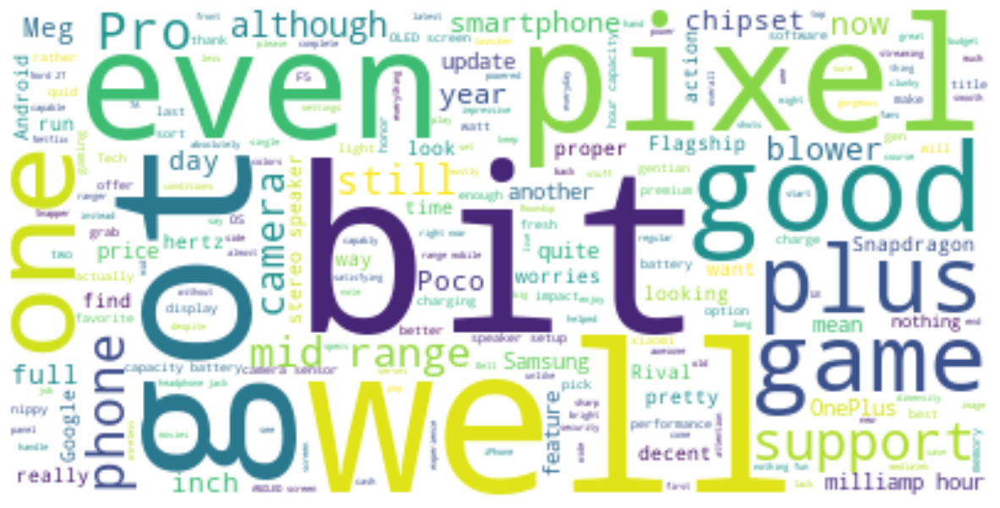

In [122]:
# Combine all reviews into a single text
text = " ".join(i for i in result_df_class.Speech)

# Create a set of stopwords
stopwords = set(STOPWORDS)

# Create a WordCloud object with specified settings
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the WordCloud visualization
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [123]:
result_df_class.dtypes

Sl.No.                  int64
Time                  float64
Speech                 object
roBERTa_Sentiment      object
Vader_Sentiment        object
LSTM_sentiment         object
CNN_sentiment          object
SimpleNN_sentiment     object
Video_Emotion          object
dtype: object

In [124]:
# Example: Count class occurrences in three columns
count_snn = result_df_class['SimpleNN_sentiment'].value_counts()
count_cnn = result_df_class['CNN_sentiment'].value_counts()
count_lstm = result_df_class['LSTM_sentiment'].value_counts()
count_vad = result_df_class['Vader_Sentiment'].value_counts()
count_rob = result_df_class['roBERTa_Sentiment'].value_counts()
emotion_vid = result_df_class['Video_Emotion'].value_counts()



In [125]:
# Example: Create a summary table
summary_table = pd.DataFrame({
    'roBERTa_Sentiment': count_rob,
    'Vader_Sentiment': count_vad,
    'LSTM_sentiment': count_lstm,
    'CNN_sentiment': count_cnn,
    'SimpleNN_sentiment': count_snn,
    'Video_Emotion': emotion_vid
})

print(summary_table)


          roBERTa_Sentiment  Vader_Sentiment  LSTM_sentiment  CNN_sentiment  \
negative                 41               36             107            105   
neutral                 244              193              95            102   
positive                135              191             218            213   

          SimpleNN_sentiment  Video_Emotion  
negative                 160            156  
neutral                  128            164  
positive                 132            100  


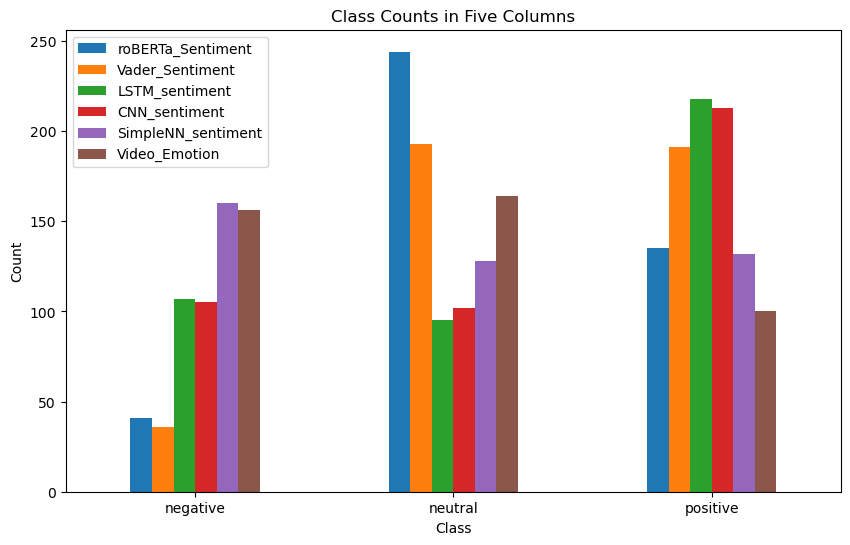

In [126]:
# Example: Create a bar plot
fig, ax = plt.subplots(figsize=(10, 6))
summary_table.plot(kind='bar', ax=ax)
ax.set_xlabel('Class')
ax.set_ylabel('Count')
ax.set_title('Class Counts in Five Columns')
plt.xticks(rotation=0)
plt.show()


In [129]:
!pip install ipywidgets


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [131]:
print(count_cnn.positive)

213


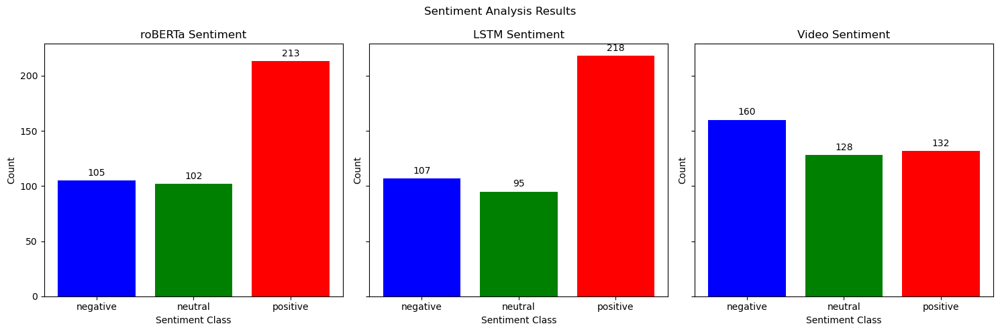

In [134]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have a DataFrame 'df' with columns 'CNN_sentiment', 'LSTM_sentiment', and 'SimpleNN_sentiment'
# Count the occurrences of each sentiment class in each column
count_rob = compare_df['roBERTa_Sentiment'].value_counts()
count_lstm = compare_df['LSTM_sentiment'].value_counts()
count_video = compare_df['Video_Emotion'].value_counts()

# Get the unique sentiment classes
sentiment_classes = compare_df['Video_Emotion'].unique()

# Create a figure with subplots for each sentiment column
fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

# Iterate through each sentiment column and plot a bar graph
for i, (sentiment_count, title) in enumerate(zip([count_cnn, count_lstm, count_simplenn], ['roBERTa Sentiment', 'LSTM Sentiment', 'Video Sentiment'])):
    ax = axs[i]
    
    # Calculate the total count for this column
    total_count = sentiment_count.sum()
    
    # Create an array to represent the bar, initializing with zeros
    bar_values = np.zeros(len(sentiment_classes))
    
    # Iterate through the sentiment classes and set the bar values
    for j, sentiment_class in enumerate(sentiment_classes):
        if sentiment_class in sentiment_count.index:
            bar_values[j] = sentiment_count[sentiment_class]
    
    # Create a bar plot
    bars = ax.bar(sentiment_classes, bar_values, color=['blue', 'green', 'red'])
    
    # Add labels on top of or within the bars
    for bar, value in zip(bars, bar_values):
        ax.annotate(str(int(value)), xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom')
    
    # Set title and labels
    ax.set_title(title)
    ax.set_xlabel('Sentiment Class')
    ax.set_ylabel('Count')
    
plt.suptitle('Sentiment Analysis Results')
plt.tight_layout()
plt.show()


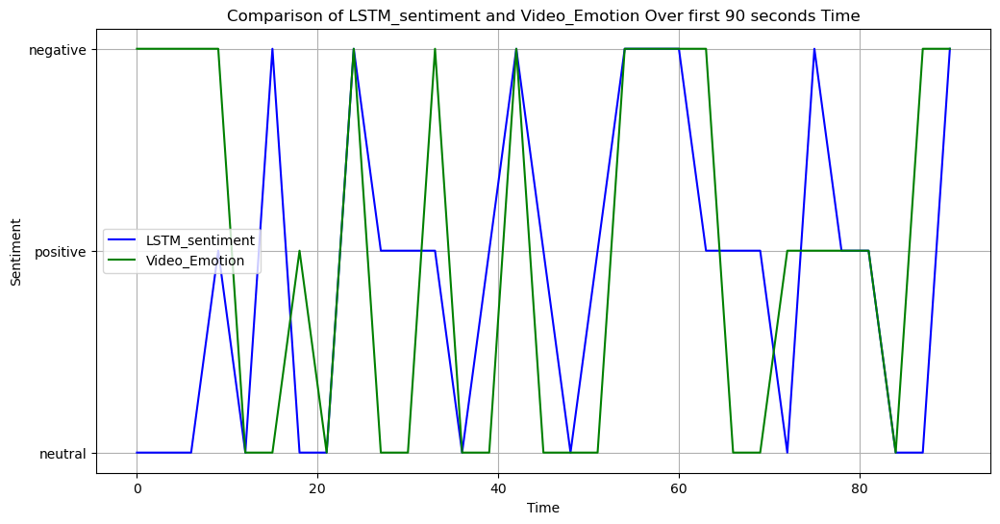

In [144]:
import seaborn as sns
import matplotlib.pyplot as plt

viz_2 =result_df_class. head(30)
# Extract the 'Time', 'LSTM_sentiment', and 'Video_Emotion' columns
time = viz_2['Time']
lstm_sentiment = viz_2['LSTM_sentiment']
video_emotion = viz_2['Video_Emotion']

# Create a line graph to compare 'CNN_sentiment' and 'Video_Emotion'
plt.figure(figsize=(12, 6))
plt.plot(time, lstm_sentiment, label='LSTM_sentiment', color='blue')
plt.plot(time, video_emotion, label='Video_Emotion', color='green')

# Add labels and a legend
plt.xlabel('Time')
plt.ylabel('Sentiment')
plt.title('Comparison of LSTM_sentiment and Video_Emotion Over first 90 seconds Time')
plt.legend()

# Show the graph
plt.grid(True)
plt.show()

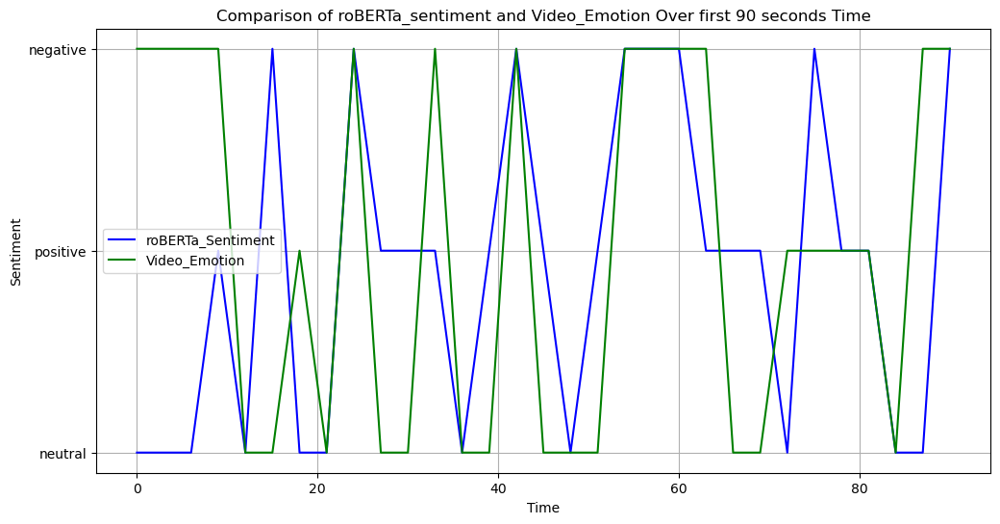

In [145]:

robertaa_sentiment = viz_2['roBERTa_Sentiment']

# Create a line graph to compare 'CNN_sentiment' and 'Video_Emotion'
plt.figure(figsize=(12, 6))
plt.plot(time, lstm_sentiment, label='roBERTa_Sentiment', color='blue')
plt.plot(time, video_emotion, label='Video_Emotion', color='green')

# Add labels and a legend
plt.xlabel('Time')
plt.ylabel('Sentiment')
plt.title('Comparison of roBERTa_sentiment and Video_Emotion Over first 90 seconds Time')
plt.legend()

# Show the graph
plt.grid(True)
plt.show()

In [ ]:
import pandas as pd
from scipy.stats import chi2_contingency

# Assuming 'result_df_class' is your DataFrame

# Initialize variables to keep track of the closest column and its Chi-Square statistic
closest_column = None
lowest_chi_square = float('inf')

# Iterate through each sentiment column
for sentiment_column in ['LSTM_sentiment', 'CNN_sentiment', 'SimpleNN_sentiment', 'Vader_Sentiment', 'roBERTa_Sentiment']:
    # Create a contingency table
    contingency_table = pd.crosstab(result_df_class['Video_Emotion'], result_df_class[sentiment_column])
    
    # Perform the Chi-Square test
    chi_square, _, _, _ = chi2_contingency(contingency_table)
    
    # Check if this column has a lower Chi-Square statistic
    if chi_square < lowest_chi_square:
        lowest_chi_square = chi_square
        closest_column = sentiment_column

# The closest column is stored in 'closest_column'
print(f"The closest column to 'Video_Emotion' is '{closest_column}' with a Chi-Square statistic of {lowest_chi_square}")


In [ ]:
from scipy.stats import chi2_contingency

# List of sentiment columns to compare
sentiment_columns = ['LSTM_sentiment', 'CNN_sentiment', 'SimpleNN_sentiment', 'Vader_Sentiment', 'roBERTa_Sentiment']

# Initialize a dictionary to store chi-squared test results
chi_squared_results = {}

# Perform chi-squared test for each sentiment column
for column in sentiment_columns:
    # Create a contingency table between 'Video_Emotion' and the current sentiment column
    contingency_table = pd.crosstab(result_df_class['Video_Emotion'], result_df_class[column])
    
    # Perform the chi-squared test
    chi2, p, _, _ = chi2_contingency(contingency_table)
    
    # Store the chi-squared statistic and p-value in the dictionary
    chi_squared_results[column] = {'Chi-Squared': chi2, 'p-value': p}

# Display the chi-squared test results
for column, results in chi_squared_results.items():
    print(f"Comparison between 'Video_Emotion' and '{column}':")
    print(f"Chi-Squared Statistic: {results['Chi-Squared']}")
    print(f"P-Value: {results['p-value']}")
    print()
